In [4]:

import pandas as pd
import numpy as np
from scipy.stats.stats import pearsonr  
from pandas.tseries.holiday import USFederalHolidayCalendar
from pandas.tseries.offsets import CustomBusinessDay
from datetime import datetime
import plotly.plotly as py
import matplotlib.pyplot as plt
import folium
# import json         # no se usa aun.
import branca.colormap as cm


## Carga de CSVs

## A continuacion se realiza la carga de archivos a los dataframe correspondientes.

In [5]:
dfEstaciones =pd.read_csv('../CSVs/station.csv', thousands=',', low_memory=False)
dfClima=pd.read_csv('../CSVs/weather.csv', thousands=',', low_memory=False)
dfViajes = pd.read_csv('../CSVs/trip.csv', thousands=',', low_memory=False)
#Df creado por nuestro grupo con la informacion que queriamos analizar de Status.csv
dfTableID_DocksAvailable = pd.read_csv('../CSVs/tabla_id_dockAvailable.csv')

   # Filtrado de dfEstaciones

## El objetivo es simplemente ver la estructura del dataframe y saber que informacion nos puede brindar.

In [6]:
print (dfEstaciones.shape) 

(70, 7)


In [7]:
dfEstaciones

,id,name,lat,long,dock_count,city,installation_date
0,2,San Jose Diridon Caltrain Station,37.329732,-121.901782,27,San Jose,8/6/2013
1,3,San Jose Civic Center,37.330698,-121.888979,15,San Jose,8/5/2013
2,4,Santa Clara at Almaden,37.333988,-121.894902,11,San Jose,8/6/2013
3,5,Adobe on Almaden,37.331415,-121.893200,19,San Jose,8/5/2013
4,6,San Pedro Square,37.336721,-121.894074,15,San Jose,8/7/2013
5,7,Paseo de San Antonio,37.333798,-121.886943,15,San Jose,8/7/2013
6,8,San Salvador at 1st,37.330165,-121.885831,15,San Jose,8/5/2013
7,9,Japantown,37.348742,-121.894715,15,San Jose,8/5/2013
8,10,San Jose City Hall,37.337391,-121.886995,15,San Jose,8/6/2013
9,11,MLK Library,37.335885,-121.885660,19,San Jose,8/6/2013


In [8]:
dfEstaciones.dtypes

id                     int64
name                  object
lat                  float64
long                 float64
dock_count             int64
city                  object
installation_date     object
dtype: object

In [9]:
# No tenemos nullos
dfEstaciones.isnull().sum()

id                   0
name                 0
lat                  0
long                 0
dock_count           0
city                 0
installation_date    0
dtype: int64

In [10]:
#Pasamos el campo installation_date al tipo datetime
dfEstaciones.installation_date = pd.to_datetime(dfEstaciones.installation_date, format = "%m/%d/%Y").dt.date

#Probamos si funciona correctamente
print (dfEstaciones.installation_date.min())
print (dfEstaciones.installation_date.max())

2013-08-05
2014-04-09


# Filtrado de df Status.csv

## status.csv era un archivo de 2GB el cual fue reducido a una tabla con la informacion que ibamos a utilizar, esta contiene la estaciones agrupadas por ID junto con los docks_available en promedio. 
## El objetivo es obtener un porcentaje, el cual represanta la utilidad de esa estacion, es decir que tanto se utilizan sus docks en relacion a los disponibles.

In [11]:
dfTableID_DocksAvailable.head()

,station_id,docks_available
0,2,13.761535
1,3,6.527884
2,4,5.685249
3,5,10.868663
4,6,7.383773


In [12]:
dfEstaciones.head()

,id,name,lat,long,dock_count,city,installation_date
0,2,San Jose Diridon Caltrain Station,37.329732,-121.901782,27,San Jose,2013-08-06
1,3,San Jose Civic Center,37.330698,-121.888979,15,San Jose,2013-08-05
2,4,Santa Clara at Almaden,37.333988,-121.894902,11,San Jose,2013-08-06
3,5,Adobe on Almaden,37.331415,-121.893200,19,San Jose,2013-08-05
4,6,San Pedro Square,37.336721,-121.894074,15,San Jose,2013-08-07


In [13]:
#Realizamos merge de dataframe 'dfEstaciones' con 'dfTableID_DocksAvailable' por ID de estacion
dfusagePercentagePerStation = dfEstaciones.merge(dfTableID_DocksAvailable, left_on='id', right_on='station_id').drop('station_id', 1)
dfusagePercentagePerStation

,id,name,lat,long,dock_count,city,installation_date,docks_available
0,2,San Jose Diridon Caltrain Station,37.329732,-121.901782,27,San Jose,2013-08-06,13.761535
1,3,San Jose Civic Center,37.330698,-121.888979,15,San Jose,2013-08-05,6.527884
2,4,Santa Clara at Almaden,37.333988,-121.894902,11,San Jose,2013-08-06,5.685249
3,5,Adobe on Almaden,37.331415,-121.893200,19,San Jose,2013-08-05,10.868663
4,6,San Pedro Square,37.336721,-121.894074,15,San Jose,2013-08-07,7.383773
5,7,Paseo de San Antonio,37.333798,-121.886943,15,San Jose,2013-08-07,6.445585
6,8,San Salvador at 1st,37.330165,-121.885831,15,San Jose,2013-08-05,7.425911
7,9,Japantown,37.348742,-121.894715,15,San Jose,2013-08-05,6.717211
8,10,San Jose City Hall,37.337391,-121.886995,15,San Jose,2013-08-06,8.633980
9,11,MLK Library,37.335885,-121.885660,19,San Jose,2013-08-06,9.473113


In [14]:
#Le damos un nombre mas significado al feature
dfusagePercentagePerStation = dfusagePercentagePerStation.rename(columns={'docks_available': 'mean_of_docks_available'})
dfusagePercentagePerStation

,id,name,lat,long,dock_count,city,installation_date,mean_of_docks_available
0,2,San Jose Diridon Caltrain Station,37.329732,-121.901782,27,San Jose,2013-08-06,13.761535
1,3,San Jose Civic Center,37.330698,-121.888979,15,San Jose,2013-08-05,6.527884
2,4,Santa Clara at Almaden,37.333988,-121.894902,11,San Jose,2013-08-06,5.685249
3,5,Adobe on Almaden,37.331415,-121.893200,19,San Jose,2013-08-05,10.868663
4,6,San Pedro Square,37.336721,-121.894074,15,San Jose,2013-08-07,7.383773
5,7,Paseo de San Antonio,37.333798,-121.886943,15,San Jose,2013-08-07,6.445585
6,8,San Salvador at 1st,37.330165,-121.885831,15,San Jose,2013-08-05,7.425911
7,9,Japantown,37.348742,-121.894715,15,San Jose,2013-08-05,6.717211
8,10,San Jose City Hall,37.337391,-121.886995,15,San Jose,2013-08-06,8.633980
9,11,MLK Library,37.335885,-121.885660,19,San Jose,2013-08-06,9.473113


In [15]:
#Obtenemos el porcentaje de utilidad de cada estacion
dfusagePercentagePerStation['docks_usage_percentage'] = dfusagePercentagePerStation.mean_of_docks_available/dfusagePercentagePerStation.dock_count
dfusagePercentagePerStation

,id,name,lat,long,dock_count,city,installation_date,mean_of_docks_available,docks_usage_percentage
0,2,San Jose Diridon Caltrain Station,37.329732,-121.901782,27,San Jose,2013-08-06,13.761535,0.509686
1,3,San Jose Civic Center,37.330698,-121.888979,15,San Jose,2013-08-05,6.527884,0.435192
2,4,Santa Clara at Almaden,37.333988,-121.894902,11,San Jose,2013-08-06,5.685249,0.516841
3,5,Adobe on Almaden,37.331415,-121.893200,19,San Jose,2013-08-05,10.868663,0.572035
4,6,San Pedro Square,37.336721,-121.894074,15,San Jose,2013-08-07,7.383773,0.492252
5,7,Paseo de San Antonio,37.333798,-121.886943,15,San Jose,2013-08-07,6.445585,0.429706
6,8,San Salvador at 1st,37.330165,-121.885831,15,San Jose,2013-08-05,7.425911,0.495061
7,9,Japantown,37.348742,-121.894715,15,San Jose,2013-08-05,6.717211,0.447814
8,10,San Jose City Hall,37.337391,-121.886995,15,San Jose,2013-08-06,8.633980,0.575599
9,11,MLK Library,37.335885,-121.885660,19,San Jose,2013-08-06,9.473113,0.498585


In [16]:
dfusagePercentagePerStation.to_csv('../CSVs/usagePercentagePerStation.csv')

# Filtrado de dfClima
## El objetivo es simplemente ver la estructura del dataframe y saber que informacion nos puede brindar.

In [17]:
dfClima

,date,max_temperature_f,mean_temperature_f,min_temperature_f,max_dew_point_f,mean_dew_point_f,min_dew_point_f,max_humidity,mean_humidity,min_humidity,...,mean_visibility_miles,min_visibility_miles,max_wind_Speed_mph,mean_wind_speed_mph,max_gust_speed_mph,precipitation_inches,cloud_cover,events,wind_dir_degrees,zip_code
0,8/29/2013,74,68,61,61,58,56,93,75,57,...,10,10,23,11,28,0,4,NaN,286,94107
1,8/30/2013,78,69,60,61,58,56,90,70,50,...,10,7,29,13,35,0,2,NaN,291,94107
2,8/31/2013,71,64,57,57,56,54,93,75,57,...,10,10,26,15,31,0,4,NaN,284,94107
3,9/1/2013,74,66,58,60,56,53,87,68,49,...,10,10,25,13,29,0,4,NaN,284,94107
4,9/2/2013,75,69,62,61,60,58,93,77,61,...,10,6,23,12,30,0,6,NaN,277,94107
5,9/3/2013,73,67,60,59,56,51,84,65,46,...,10,10,24,15,31,0,2,NaN,276,94107
6,9/4/2013,74,68,61,59,57,56,90,72,53,...,10,10,29,19,35,0,4,NaN,269,94107
7,9/5/2013,72,66,60,57,56,54,90,74,57,...,10,10,31,21,37,0,3,NaN,270,94107
8,9/6/2013,85,71,56,57,51,45,86,58,29,...,10,10,24,8,28,0,0,NaN,287,94107
9,9/7/2013,88,73,58,64,54,46,86,59,31,...,10,10,21,8,25,0,1,NaN,305,94107


In [18]:
dfClima.shape

(3665, 24)

In [19]:
#Vemos que contiene muchos nulos
dfClima.isnull().sum()

date                                 0
max_temperature_f                    4
mean_temperature_f                   4
min_temperature_f                    4
max_dew_point_f                     54
mean_dew_point_f                    54
min_dew_point_f                     54
max_humidity                        54
mean_humidity                       54
min_humidity                        54
max_sea_level_pressure_inches        1
mean_sea_level_pressure_inches       1
min_sea_level_pressure_inches        1
max_visibility_miles                13
mean_visibility_miles               13
min_visibility_miles                13
max_wind_Speed_mph                   1
mean_wind_speed_mph                  1
max_gust_speed_mph                 899
precipitation_inches                 1
cloud_cover                          1
events                            3143
wind_dir_degrees                     1
zip_code                             0
dtype: int64

In [20]:
#Pasamos a datetime
dfClima.date = pd.to_datetime(dfClima.date, format='%m/%d/%Y')

In [21]:
dfClima.head(10)

,date,max_temperature_f,mean_temperature_f,min_temperature_f,max_dew_point_f,mean_dew_point_f,min_dew_point_f,max_humidity,mean_humidity,min_humidity,...,mean_visibility_miles,min_visibility_miles,max_wind_Speed_mph,mean_wind_speed_mph,max_gust_speed_mph,precipitation_inches,cloud_cover,events,wind_dir_degrees,zip_code
0,2013-08-29,74,68,61,61,58,56,93,75,57,...,10,10,23,11,28,0,4,NaN,286,94107
1,2013-08-30,78,69,60,61,58,56,90,70,50,...,10,7,29,13,35,0,2,NaN,291,94107
2,2013-08-31,71,64,57,57,56,54,93,75,57,...,10,10,26,15,31,0,4,NaN,284,94107
3,2013-09-01,74,66,58,60,56,53,87,68,49,...,10,10,25,13,29,0,4,NaN,284,94107
4,2013-09-02,75,69,62,61,60,58,93,77,61,...,10,6,23,12,30,0,6,NaN,277,94107
5,2013-09-03,73,67,60,59,56,51,84,65,46,...,10,10,24,15,31,0,2,NaN,276,94107
6,2013-09-04,74,68,61,59,57,56,90,72,53,...,10,10,29,19,35,0,4,NaN,269,94107
7,2013-09-05,72,66,60,57,56,54,90,74,57,...,10,10,31,21,37,0,3,NaN,270,94107
8,2013-09-06,85,71,56,57,51,45,86,58,29,...,10,10,24,8,28,0,0,NaN,287,94107
9,2013-09-07,88,73,58,64,54,46,86,59,31,...,10,10,21,8,25,0,1,NaN,305,94107


In [22]:
dfClima.events.unique()

array([nan, 'Fog', 'Rain', 'Fog-Rain', 'rain', 'Rain-Thunderstorm'], dtype=object)

In [23]:
#Limpio los datos bugeados, tenemos mucha informacion nula, la cual decidimos pasar a Normal
#Tambien corregi
dfClima.loc[dfClima.events == 'rain', 'events'] = "Rain"
dfClima.loc[dfClima.events.isnull(), 'events'] = "Normal"

In [24]:
# EL zip_code es el codigo postal para las 5 ciudades de la bahia
dfClima.zip_code.unique()

array([94107, 94063, 94301, 94041, 95113])

In [25]:
# Vemos cual de estos zip code tiene menos nulos
for zc in dfClima.zip_code.unique():
    print (dfClima[dfClima.zip_code == zc].isnull().sum())
    print ()

date                               0
max_temperature_f                  0
mean_temperature_f                 0
min_temperature_f                  0
max_dew_point_f                    0
mean_dew_point_f                   0
min_dew_point_f                    0
max_humidity                       0
mean_humidity                      0
min_humidity                       0
max_sea_level_pressure_inches      0
mean_sea_level_pressure_inches     0
min_sea_level_pressure_inches      0
max_visibility_miles               0
mean_visibility_miles              0
min_visibility_miles               0
max_wind_Speed_mph                 0
mean_wind_speed_mph                0
max_gust_speed_mph                13
precipitation_inches               0
cloud_cover                        0
events                             0
wind_dir_degrees                   0
zip_code                           0
dtype: int64
()
date                                0
max_temperature_f                   0
mean_temperature_f  

In [26]:
#Trabajamos con el zip_code == 94107, es el mas 'limpio' de nulos, dada la cercania de todas las ciudades 
#la informacion no puede ser muy cambiante entre estas, por lo cual consideramos valido filtrar por una en particular.
dfClimaLimpio = dfClima[dfClima.zip_code == 94107]
dfClimaLimpio.shape

(733, 24)

In [27]:
dfClimaLimpio.events

0                  Normal
1                  Normal
2                  Normal
3                  Normal
4                  Normal
5                  Normal
6                  Normal
7                  Normal
8                  Normal
9                  Normal
10                 Normal
11                 Normal
12                 Normal
13                 Normal
14                    Fog
15                 Normal
16                 Normal
17                 Normal
18                 Normal
19                 Normal
20                 Normal
21                 Normal
22                 Normal
23                   Rain
24                 Normal
25                 Normal
26                 Normal
27                 Normal
28                 Normal
29                 Normal
              ...        
2175               Normal
2176               Normal
2177               Normal
2178               Normal
2179    Rain-Thunderstorm
2180               Normal
2181               Normal
2182        

In [28]:
#Transformamos el feature events, en un nuevo dataframe el cual añadiremos a dfClimaLimpio
events = pd.get_dummies(dfClimaLimpio.events)
events

,Fog,Fog-Rain,Normal,Rain,Rain-Thunderstorm
0,0,0,1,0,0
1,0,0,1,0,0
2,0,0,1,0,0
3,0,0,1,0,0
4,0,0,1,0,0
5,0,0,1,0,0
6,0,0,1,0,0
7,0,0,1,0,0
8,0,0,1,0,0
9,0,0,1,0,0


In [29]:
#Mergeo los 2 data frames, eventos con dfClimaLimpio
dfClimaLimpio = dfClimaLimpio.merge(events, left_index = True, right_index = True)
#Saco los features que no voy a usar
dfClimaLimpio = dfClimaLimpio.drop(['events','zip_code'],1)

In [30]:
#Todavia tenemos nulos
dfClimaLimpio.isnull().sum()

date                               0
max_temperature_f                  0
mean_temperature_f                 0
min_temperature_f                  0
max_dew_point_f                    0
mean_dew_point_f                   0
min_dew_point_f                    0
max_humidity                       0
mean_humidity                      0
min_humidity                       0
max_sea_level_pressure_inches      0
mean_sea_level_pressure_inches     0
min_sea_level_pressure_inches      0
max_visibility_miles               0
mean_visibility_miles              0
min_visibility_miles               0
max_wind_Speed_mph                 0
mean_wind_speed_mph                0
max_gust_speed_mph                13
precipitation_inches               0
cloud_cover                        0
wind_dir_degrees                   0
Fog                                0
Fog-Rain                           0
Normal                             0
Rain                               0
Rain-Thunderstorm                  0
d

In [31]:
#El campo max_gust_speed_mph no esta limpio todavia, lo trabajo
#Para cada valor de max_wind, busco la media de max_gust y la uso para rellenar los nulos.
dfClimaLimpio.loc[dfClimaLimpio.max_gust_speed_mph.isnull(), 'max_gust_speed_mph'] = \
                                dfClimaLimpio.groupby('max_wind_Speed_mph').\
                                max_gust_speed_mph.apply(lambda x: x.fillna(x.median()))

In [32]:
# Listo para usar
dfClimaLimpio.isnull().sum()

date                              0
max_temperature_f                 0
mean_temperature_f                0
min_temperature_f                 0
max_dew_point_f                   0
mean_dew_point_f                  0
min_dew_point_f                   0
max_humidity                      0
mean_humidity                     0
min_humidity                      0
max_sea_level_pressure_inches     0
mean_sea_level_pressure_inches    0
min_sea_level_pressure_inches     0
max_visibility_miles              0
mean_visibility_miles             0
min_visibility_miles              0
max_wind_Speed_mph                0
mean_wind_speed_mph               0
max_gust_speed_mph                0
precipitation_inches              0
cloud_cover                       0
wind_dir_degrees                  0
Fog                               0
Fog-Rain                          0
Normal                            0
Rain                              0
Rain-Thunderstorm                 0
dtype: int64

In [33]:
# el campo precipitation_inches lo deseamos de tipo numerico
dfClimaLimpio.dtypes

date                              datetime64[ns]
max_temperature_f                        float64
mean_temperature_f                       float64
min_temperature_f                        float64
max_dew_point_f                          float64
mean_dew_point_f                         float64
min_dew_point_f                          float64
max_humidity                             float64
mean_humidity                            float64
min_humidity                             float64
max_sea_level_pressure_inches            float64
mean_sea_level_pressure_inches           float64
min_sea_level_pressure_inches            float64
max_visibility_miles                     float64
mean_visibility_miles                    float64
min_visibility_miles                     float64
max_wind_Speed_mph                       float64
mean_wind_speed_mph                      float64
max_gust_speed_mph                       float64
precipitation_inches                      object
cloud_cover         

In [34]:
dfClimaLimpio.precipitation_inches


0          0
1          0
2          0
3          0
4          0
5          0
6          0
7          0
8          0
9          0
10         0
11         0
12         0
13         0
14         0
15         0
16         0
17         0
18         0
19         0
20         0
21         0
22         0
23      0.23
24         0
25         0
26         0
27         0
28         0
29         0
        ... 
2175       0
2176       0
2177       0
2178       0
2179       T
2180       0
2181       0
2182       0
2183       0
2184       0
2185       0
2186       0
2187       0
2188       0
2189       0
2190       0
2191       0
2192       0
2193       0
2194       0
2195       0
2196       0
2197       0
2198       0
2199       0
2200       0
2201       0
2202       T
2203       0
2204       0
Name: precipitation_inches, dtype: object

In [35]:
#Cambio el feature de string a numeric, los valores que son 'T' los cambio por NAN
dfClimaLimpio.precipitation_inches = pd.to_numeric(dfClimaLimpio.precipitation_inches, errors = 'coerce')

In [36]:
#Change null values to the median, of values > 0, because T, I think, means True. 
#Therefore we want to find the median amount of precipitation on days when it rained.
dfClimaLimpio.loc[dfClimaLimpio.precipitation_inches.isnull(), 'precipitation_inches'] = \
dfClimaLimpio[dfClimaLimpio.precipitation_inches.notnull()].precipitation_inches.median()

## Cambiamos unidades norteamericanas por unidades mks

In [37]:
# Cambiamos nombre de features
dfClimaLimpio=dfClimaLimpio.rename(columns={'max_temperature_f':'max_temperature_c', 'mean_temperature_f':'mean_temperature_c',\
            'max_dew_point_f':'max_dew_point_c','min_temperature_f':'min_temperature_c',\
            'mean_dew_point_f':'mean_dew_point_c','min_dew_point_f':'min_dew_point_c',\
            'max_sea_level_pressure_inches':'max_sea_level_pressure_cm','mean_sea_level_pressure_inches':'mean_sea_level_pressure_cm', \
            'min_sea_level_pressure_inches':'min_sea_level_pressure_cm','precipitation_inches':'precipitation_cm', \
            'max_visibility_miles':'max_visibility_km','mean_visibility_miles':'mean_visibility_km', \
            'min_visibility_miles':'min_visibility_km','max_wind_Speed_mph':'max_wind_Speed_kmh',\
            'mean_wind_speed_mph':'mean_wind_speed_kmh','max_gust_speed_mph':'max_gust_speed_kmh'})

In [38]:
#Aplicamos las funciones para el cambio de unidades
def farToCelsius(x):
    x = (x - 32 )/ 1.8
    return float(x)

def pulgToCm(x):
    x = x * 2.54
    return float(x)
def milesToKm (x):
    x = x* 1.60934
    return float(x)

dfClimaLimpio.max_temperature_c = dfClimaLimpio.max_temperature_c.apply(farToCelsius)
dfClimaLimpio.mean_temperature_c = dfClimaLimpio.mean_temperature_c.apply(farToCelsius)
dfClimaLimpio.min_temperature_c =dfClimaLimpio.min_temperature_c.apply(farToCelsius)
dfClimaLimpio.max_dew_point_c = dfClimaLimpio.max_dew_point_c.apply(farToCelsius)
dfClimaLimpio.mean_dew_point_c = dfClimaLimpio.mean_dew_point_c.apply(farToCelsius)
dfClimaLimpio.min_dew_point_c = dfClimaLimpio.min_dew_point_c.apply(farToCelsius)
dfClimaLimpio.max_sea_level_pressure_cm = dfClimaLimpio.max_sea_level_pressure_cm.apply(pulgToCm)
dfClimaLimpio.mean_sea_level_pressure_cm= dfClimaLimpio.mean_sea_level_pressure_cm.apply(pulgToCm)
dfClimaLimpio.min_sea_level_pressure_cm = dfClimaLimpio.min_sea_level_pressure_cm.apply(pulgToCm)
dfClimaLimpio.precipitation_cm = dfClimaLimpio.precipitation_cm.apply(pulgToCm)
dfClimaLimpio.max_visibility_km = dfClimaLimpio.max_visibility_km.apply(milesToKm)
dfClimaLimpio.mean_visibility_km = dfClimaLimpio.mean_visibility_km.apply(milesToKm)
dfClimaLimpio.min_visibility_km = dfClimaLimpio.min_visibility_km.apply(milesToKm)
dfClimaLimpio.max_wind_Speed_kmh = dfClimaLimpio.max_wind_Speed_kmh.apply(milesToKm)
dfClimaLimpio.mean_wind_speed_kmh = dfClimaLimpio.mean_wind_speed_kmh.apply(milesToKm)
dfClimaLimpio.max_gust_speed_kmhh = dfClimaLimpio.max_gust_speed_kmh.apply(milesToKm)



dfClimaLimpio

,date,max_temperature_c,mean_temperature_c,min_temperature_c,max_dew_point_c,mean_dew_point_c,min_dew_point_c,max_humidity,mean_humidity,min_humidity,...,mean_wind_speed_kmh,max_gust_speed_kmh,precipitation_cm,cloud_cover,wind_dir_degrees,Fog,Fog-Rain,Normal,Rain,Rain-Thunderstorm
0,2013-08-29,23.333333,20.000000,16.111111,16.111111,14.444444,13.333333,93,75,57,...,17.70274,28,0.0000,4,286,0,0,1,0,0
1,2013-08-30,25.555556,20.555556,15.555556,16.111111,14.444444,13.333333,90,70,50,...,20.92142,35,0.0000,2,291,0,0,1,0,0
2,2013-08-31,21.666667,17.777778,13.888889,13.888889,13.333333,12.222222,93,75,57,...,24.14010,31,0.0000,4,284,0,0,1,0,0
3,2013-09-01,23.333333,18.888889,14.444444,15.555556,13.333333,11.666667,87,68,49,...,20.92142,29,0.0000,4,284,0,0,1,0,0
4,2013-09-02,23.888889,20.555556,16.666667,16.111111,15.555556,14.444444,93,77,61,...,19.31208,30,0.0000,6,277,0,0,1,0,0
5,2013-09-03,22.777778,19.444444,15.555556,15.000000,13.333333,10.555556,84,65,46,...,24.14010,31,0.0000,2,276,0,0,1,0,0
6,2013-09-04,23.333333,20.000000,16.111111,15.000000,13.888889,13.333333,90,72,53,...,30.57746,35,0.0000,4,269,0,0,1,0,0
7,2013-09-05,22.222222,18.888889,15.555556,13.888889,13.333333,12.222222,90,74,57,...,33.79614,37,0.0000,3,270,0,0,1,0,0
8,2013-09-06,29.444444,21.666667,13.333333,13.888889,10.555556,7.222222,86,58,29,...,12.87472,28,0.0000,0,287,0,0,1,0,0
9,2013-09-07,31.111111,22.777778,14.444444,17.777778,12.222222,7.777778,86,59,31,...,12.87472,25,0.0000,1,305,0,0,1,0,0


Analisis de Estaciones de llegadas en climas calurosos

In [39]:
#Objetivo: Posible construccion de estacion de bebidas para los bikers
#Concideramos solo el ZipCode 94107. La variacion de temperaturas entre zipcodes la concideramos despreciable
#Creamos nuevos DataFrames con los datos que nos interesan, para trabajar mas comodamente.

data = {'date' : dfClimaLimpio['date'],'max_temperature_c' : dfClimaLimpio['max_temperature_c'],
     'mean_temperature_c' : dfClimaLimpio['mean_temperature_c'],'min_temperature_c' : dfClimaLimpio['min_temperature_c'],
       'max_dew_point_c': dfClimaLimpio['max_dew_point_c'], 'mean_dew_point_c': dfClimaLimpio['mean_dew_point_c'],
       'min_dew_point_c':dfClimaLimpio['min_dew_point_c']}
clima = pd.DataFrame(data = data)
clima

,date,max_dew_point_c,max_temperature_c,mean_dew_point_c,mean_temperature_c,min_dew_point_c,min_temperature_c
0,2013-08-29,16.111111,23.333333,14.444444,20.000000,13.333333,16.111111
1,2013-08-30,16.111111,25.555556,14.444444,20.555556,13.333333,15.555556
2,2013-08-31,13.888889,21.666667,13.333333,17.777778,12.222222,13.888889
3,2013-09-01,15.555556,23.333333,13.333333,18.888889,11.666667,14.444444
4,2013-09-02,16.111111,23.888889,15.555556,20.555556,14.444444,16.666667
5,2013-09-03,15.000000,22.777778,13.333333,19.444444,10.555556,15.555556
6,2013-09-04,15.000000,23.333333,13.888889,20.000000,13.333333,16.111111
7,2013-09-05,13.888889,22.222222,13.333333,18.888889,12.222222,15.555556
8,2013-09-06,13.888889,29.444444,10.555556,21.666667,7.222222,13.333333
9,2013-09-07,17.777778,31.111111,12.222222,22.777778,7.777778,14.444444


In [40]:
d = {'date' : dfViajes['end_date'], 'end_station_name' : dfViajes['end_station_name'],
     'subscription_type' : dfViajes['subscription_type']}
viajes = pd.DataFrame(data = d)
#¿Por que tantos datetime?
#Porque el primero es para transformar el Object a datetime, despues al quedarme con solo la fecha lo vuelve a transformar
# en Object. Y para transformar ese object uso otro datetime.
viajes.date = pd.to_datetime(dfViajes.end_date,format = '%m/%d/%Y %H:%M')
viajes.date = viajes.date.dt.date
viajes.date = pd.to_datetime(viajes.date,format = '%Y-%m-%d')
viajes

,date,end_station_name,subscription_type
0,2013-08-29,South Van Ness at Market,Subscriber
1,2013-08-29,San Jose City Hall,Subscriber
2,2013-08-29,Mountain View City Hall,Subscriber
3,2013-08-29,San Jose City Hall,Subscriber
4,2013-08-29,Market at 10th,Subscriber
5,2013-08-29,Golden Gate at Polk,Subscriber
6,2013-08-29,Adobe on Almaden,Subscriber
7,2013-08-29,San Salvador at 1st,Subscriber
8,2013-08-29,South Van Ness at Market,Subscriber
9,2013-08-29,MLK Library,Subscriber


In [41]:
#Filtro por Clima caluroso = Temperatura maxima mayora 30ºC.
climaCaluroso = clima[clima['max_temperature_c'] > 30]
climaCaluroso

,date,max_dew_point_c,max_temperature_c,mean_dew_point_c,mean_temperature_c,min_dew_point_c,min_temperature_c
9,2013-09-07,17.777778,31.111111,12.222222,22.777778,7.777778,14.444444
980,2014-04-30,13.333333,31.666667,10.000000,22.777778,5.555556,13.888889
993,2014-05-13,10.555556,32.777778,6.666667,23.333333,1.666667,13.333333
994,2014-05-14,11.666667,32.222222,7.777778,23.888889,3.333333,15.000000
1066,2014-07-25,15.000000,32.222222,13.333333,23.888889,7.222222,15.555556
1871,2014-10-02,16.111111,30.555556,8.888889,21.111111,5.555556,11.111111
1872,2014-10-03,15.000000,31.666667,9.444444,22.222222,5.555556,12.777778
1873,2014-10-04,12.777778,33.333333,7.777778,23.333333,4.444444,12.777778
1874,2014-10-05,13.888889,31.111111,11.111111,21.666667,7.222222,11.666667
2120,2015-06-08,13.888889,31.111111,12.777778,22.222222,11.666667,13.333333


In [42]:
#Uno los viajes con los climas, correspondiente a las fechas de cada viaje
viajesCalurosos = pd.merge(viajes,climaCaluroso,on='date',how='inner')
viajesCalurosos

,date,end_station_name,subscription_type,max_dew_point_c,max_temperature_c,mean_dew_point_c,mean_temperature_c,min_dew_point_c,min_temperature_c
0,2013-09-07,Embarcadero at Bryant,Customer,17.777778,31.111111,12.222222,22.777778,7.777778,14.444444
1,2013-09-07,Howard at 2nd,Customer,17.777778,31.111111,12.222222,22.777778,7.777778,14.444444
2,2013-09-07,Harry Bridges Plaza (Ferry Building),Customer,17.777778,31.111111,12.222222,22.777778,7.777778,14.444444
3,2013-09-07,Harry Bridges Plaza (Ferry Building),Customer,17.777778,31.111111,12.222222,22.777778,7.777778,14.444444
4,2013-09-07,Washington at Kearney,Customer,17.777778,31.111111,12.222222,22.777778,7.777778,14.444444
5,2013-09-07,Embarcadero at Sansome,Customer,17.777778,31.111111,12.222222,22.777778,7.777778,14.444444
6,2013-09-07,Evelyn Park and Ride,Subscriber,17.777778,31.111111,12.222222,22.777778,7.777778,14.444444
7,2013-09-07,Franklin at Maple,Subscriber,17.777778,31.111111,12.222222,22.777778,7.777778,14.444444
8,2013-09-07,Beale at Market,Customer,17.777778,31.111111,12.222222,22.777778,7.777778,14.444444
9,2013-09-07,South Van Ness at Market,Subscriber,17.777778,31.111111,12.222222,22.777778,7.777778,14.444444


In [43]:
#Agrupamos por estaciones y contamos la cantidad de viajes que tuvo cada estacion (contamos por date)
viajesCalurosos.groupby(viajesCalurosos.end_station_name).count().sort_values(by='date',ascending = False)

,date,subscription_type,max_dew_point_c,max_temperature_c,mean_dew_point_c,mean_temperature_c,min_dew_point_c,min_temperature_c
end_station_name,,,,,,,,
San Francisco Caltrain (Townsend at 4th),1258,1258,1258,1258,1258,1258,1258,1258
San Francisco Caltrain 2 (330 Townsend),793,793,793,793,793,793,793,793
Harry Bridges Plaza (Ferry Building),790,790,790,790,790,790,790,790
2nd at Townsend,714,714,714,714,714,714,714,714
Market at Sansome,608,608,608,608,608,608,608,608
Steuart at Market,606,606,606,606,606,606,606,606
Embarcadero at Sansome,565,565,565,565,565,565,565,565
Townsend at 7th,529,529,529,529,529,529,529,529
Temporary Transbay Terminal (Howard at Beale),443,443,443,443,443,443,443,443


# Filtrado de dfViajes
## El objetivo es simplemente ver la estructura del dataframe y saber que informacion nos puede brindar.

In [44]:
dfViajes.isnull().sum()

id                       0
duration                 0
start_date               0
start_station_name       0
start_station_id         0
end_date                 0
end_station_name         0
end_station_id           0
bike_id                  0
subscription_type        0
zip_code              6619
dtype: int64

In [45]:
# El tamaño es manejable
dfViajes.shape

(669959, 11)

In [46]:
dfViajes

,id,duration,start_date,start_station_name,start_station_id,end_date,end_station_name,end_station_id,bike_id,subscription_type,zip_code
0,4576,63,8/29/2013 14:13,South Van Ness at Market,66,8/29/2013 14:14,South Van Ness at Market,66,520,Subscriber,94127
1,4607,70,8/29/2013 14:42,San Jose City Hall,10,8/29/2013 14:43,San Jose City Hall,10,661,Subscriber,95138
2,4130,71,8/29/2013 10:16,Mountain View City Hall,27,8/29/2013 10:17,Mountain View City Hall,27,48,Subscriber,97214
3,4251,77,8/29/2013 11:29,San Jose City Hall,10,8/29/2013 11:30,San Jose City Hall,10,26,Subscriber,95060
4,4299,83,8/29/2013 12:02,South Van Ness at Market,66,8/29/2013 12:04,Market at 10th,67,319,Subscriber,94103
5,4927,103,8/29/2013 18:54,Golden Gate at Polk,59,8/29/2013 18:56,Golden Gate at Polk,59,527,Subscriber,94109
6,4500,109,8/29/2013 13:25,Santa Clara at Almaden,4,8/29/2013 13:27,Adobe on Almaden,5,679,Subscriber,95112
7,4563,111,8/29/2013 14:02,San Salvador at 1st,8,8/29/2013 14:04,San Salvador at 1st,8,687,Subscriber,95112
8,4760,113,8/29/2013 17:01,South Van Ness at Market,66,8/29/2013 17:03,South Van Ness at Market,66,553,Subscriber,94103
9,4258,114,8/29/2013 11:33,San Jose City Hall,10,8/29/2013 11:35,MLK Library,11,107,Subscriber,95060


In [47]:
#Duracion de todos los viajes
dfViajes.duration.describe()

count      669959.000000
mean         1107.949846
std         22255.437020
min            60.000000
25%           344.000000
50%           517.000000
75%           755.000000
max      17270400.000000
Name: duration, dtype: float64

In [48]:
# Lo paso a minutos y el promedio de viaje
dfViajes.duration /=60

In [49]:
dfViajes.duration.describe()

count    669959.000000
mean         18.465831
std         370.923950
min           1.000000
25%           5.733333
50%           8.616667
75%          12.583333
max      287840.000000
Name: duration, dtype: float64

Cantidad de viajes: 669959

In [50]:
dfViajes.dtypes

id                      int64
duration              float64
start_date             object
start_station_name     object
start_station_id        int64
end_date               object
end_station_name       object
end_station_id          int64
bike_id                 int64
subscription_type      object
zip_code               object
dtype: object

In [51]:
#Transformar de Object a DateTime
#El Date Time almacena YYYY-mm-dd
dfViajes.start_date = pd.to_datetime(dfViajes.start_date,format = '%m/%d/%Y %H:%M')
dfViajes.end_date = pd.to_datetime(dfViajes.end_date,format = '%m/%d/%Y %H:%M')

In [52]:
dfViajes2 = dfViajes

# A PARTIR DE ACA COMIENZA EL ANALISIS EXPLORATORIO DE LA INFORMACION

## Explicar objetivo que se desea aca (PARTE MARTIN)

In [53]:
#Primera vision para ver cuales de las estaciones fueron las mas usadas para la salida
#Podemos contar la cantidad de viajes solicitados en la Estacion mediante los datos del ID.
grupoStartStation = dfViajes.groupby(dfViajes['start_station_name']).count()
#grupoStartStation.sort_values(by='id',ascending = False)

In [54]:
#Primera vision para ver cuales de las estaciones fueron las mas usadas para la llegada
#Podemos contar la cantidad de viajes solicitados en la Estacion mediante los datos del ID.
grupoStartStation = dfViajes.groupby(dfViajes['end_station_name']).count()
grupoStartStation.sort_values(by='id',ascending = False)

,id,duration,start_date,start_station_name,start_station_id,end_date,end_station_id,bike_id,subscription_type,zip_code
end_station_name,,,,,,,,,,
San Francisco Caltrain (Townsend at 4th),63179,63179,63179,63179,63179,63179,63179,63179,63179,62991
San Francisco Caltrain 2 (330 Townsend),35117,35117,35117,35117,35117,35117,35117,35117,35117,35042
Harry Bridges Plaza (Ferry Building),33193,33193,33193,33193,33193,33193,33193,33193,33193,32665
Embarcadero at Sansome,30796,30796,30796,30796,30796,30796,30796,30796,30796,29796
2nd at Townsend,28529,28529,28529,28529,28529,28529,28529,28529,28529,28348
Market at Sansome,28033,28033,28033,28033,28033,28033,28033,28033,28033,27858
Townsend at 7th,26637,26637,26637,26637,26637,26637,26637,26637,26637,26570
Steuart at Market,25025,25025,25025,25025,25025,25025,25025,25025,25025,24749
Temporary Transbay Terminal (Howard at Beale),23080,23080,23080,23080,23080,23080,23080,23080,23080,22999


In [55]:
#23981 estaciones fueron simultaneamente estaciones de LLegada y Salida. 
#La mayoria de las estaciones fueron unicamente de Llegada o Salida
grupoEstacionesIguales = dfViajes[(dfViajes['start_station_name'] == (dfViajes['end_station_name']))]
#grupoEstacionesIguales

In [56]:
#Para los Viajes donde sus estaciones de llegada y salida son diferentes, estas son las estaciones de salida mas usadas.
grupoViajesDeEstacionesDiferentes = dfViajes[(dfViajes['start_station_name'] != (dfViajes['end_station_name']))]
ordenado = grupoViajesDeEstacionesDiferentes.groupby(dfViajes['start_station_name']).count().sort_values(by='id',ascending = False)
#ordenado

In [57]:
#Para los Viajes donde sus estaciones de llegada y salida son iguales, estas son las estaciones de salida mas usadas.
grupoViajesDeEstacionesIguales = dfViajes[(dfViajes['start_station_name'] == (dfViajes['end_station_name']))]
ordenado = grupoViajesDeEstacionesIguales.groupby(dfViajes['start_station_name']).count().sort_values(by='id',ascending = False)
#ordenado

In [58]:
#Estaciones de salida.Franja Horaria Desde las 06 hasta las 12
grupoSalidaManiana = dfViajes[(dfViajes.start_date.dt.hour > 6 )&(dfViajes.start_date.dt.hour < 12)]
grupoSalidaManiana

,id,duration,start_date,start_station_name,start_station_id,end_date,end_station_name,end_station_id,bike_id,subscription_type,zip_code
2,4130,1.183333,2013-08-29 10:16:00,Mountain View City Hall,27,2013-08-29 10:17:00,Mountain View City Hall,27,48,Subscriber,97214
3,4251,1.283333,2013-08-29 11:29:00,San Jose City Hall,10,2013-08-29 11:30:00,San Jose City Hall,10,26,Subscriber,95060
9,4258,1.900000,2013-08-29 11:33:00,San Jose City Hall,10,2013-08-29 11:35:00,MLK Library,11,107,Subscriber,95060
16,4242,2.350000,2013-08-29 11:25:00,San Jose City Hall,10,2013-08-29 11:27:00,San Jose City Hall,10,26,Subscriber,95060
22,4265,2.516667,2013-08-29 11:40:00,San Francisco City Hall,58,2013-08-29 11:42:00,San Francisco City Hall,58,520,Subscriber,94110
24,4168,2.683333,2013-08-29 10:56:00,Beale at Market,56,2013-08-29 10:59:00,Steuart at Market,74,414,Customer,94117
30,4276,2.883333,2013-08-29 11:45:00,2nd at Townsend,61,2013-08-29 11:48:00,2nd at South Park,64,280,Customer,95819
32,4069,2.900000,2013-08-29 09:08:00,2nd at South Park,64,2013-08-29 09:11:00,2nd at South Park,64,288,Subscriber,94114
34,4086,2.966667,2013-08-29 09:42:00,Commercial at Montgomery,45,2013-08-29 09:45:00,Commercial at Montgomery,45,379,Subscriber,94402
55,4081,3.633333,2013-08-29 09:38:00,Mountain View City Hall,27,2013-08-29 09:41:00,Mountain View City Hall,27,150,Subscriber,97214


In [59]:
#Agrupo por Estacion y cuento la cantidad de ID de viaje en el grupo para saber cuantas veces fue usada una estacion salida
grupoSalidaManiana.groupby(grupoSalidaManiana['start_station_name']).count().sort_values(by='id',ascending = False)

,id,duration,start_date,start_station_id,end_date,end_station_name,end_station_id,bike_id,subscription_type,zip_code
start_station_name,,,,,,,,,,
San Francisco Caltrain (Townsend at 4th),29382,29382,29382,29382,29382,29382,29382,29382,29382,29314
San Francisco Caltrain 2 (330 Townsend),19494,19494,19494,19494,19494,19494,19494,19494,19494,19460
Harry Bridges Plaza (Ferry Building),15816,15816,15816,15816,15816,15816,15816,15816,15816,15657
Temporary Transbay Terminal (Howard at Beale),13863,13863,13863,13863,13863,13863,13863,13863,13863,13836
Steuart at Market,11294,11294,11294,11294,11294,11294,11294,11294,11294,11230
2nd at Townsend,8776,8776,8776,8776,8776,8776,8776,8776,8776,8749
Grant Avenue at Columbus Avenue,8766,8766,8766,8766,8766,8766,8766,8766,8766,8723
Market at Sansome,7565,7565,7565,7565,7565,7565,7565,7565,7565,7517
Civic Center BART (7th at Market),7441,7441,7441,7441,7441,7441,7441,7441,7441,7372


In [60]:
#Estaciones de salida.Franja Horaria Desde las 12 hasta las 14
grupoSalidaMediodia = dfViajes[(dfViajes.start_date.dt.hour > 12 )&(dfViajes.start_date.dt.hour < 14)]
#grupoSalidaMediodia.groupby(grupoSalidaMediodia['start_station_name']).count().sort_values(by='id',ascending = False)

In [61]:
#Estaciones de salida.Franja Horaria Desde las 14  hasta las 19
grupoSalidaTarde = dfViajes[(dfViajes.start_date.dt.hour > 14 )&(dfViajes.start_date.dt.hour < 19)]
#grupoSalidaTarde.groupby(grupoSalidaTarde['start_station_name']).count().sort_values(by='id',ascending = False)

In [62]:
#Estaciones de salida.Franja Horaria Desde las 19  hasta las 00
grupoSalidaNoche = dfViajes[(dfViajes.start_date.dt.hour > 19)]
#grupoSalidaNoche.groupby(grupoSalidaNoche['start_station_name']).count().sort_values(by='id',ascending = False)

In [63]:
#Estaciones de salida.Franja Horaria Desde las 00 hasta las 6
grupoSalidaTransnoche = dfViajes[(dfViajes.start_date.dt.hour < 6)]
#grupoSalidaTransnoche.groupby(grupoSalidaTransnoche['start_station_name']).count().sort_values(by='id',ascending = False)

In [64]:
#Estaciones de llegada.Franja Horaria Desde las 06 hasta las 12
grupoLlegadaManiana = dfViajes[(dfViajes.end_date.dt.hour > 6 )&(dfViajes.end_date.dt.hour < 12)]
#grupoLlegadaManiana.groupby(grupoLlegadaManiana['end_station_name']).count().sort_values(by='id',ascending = False)

In [65]:
#Estaciones de llegada.Franja Horaria Desde las 12 hasta las 14
grupoLlegadaMediodia = dfViajes[(dfViajes.end_date.dt.hour > 12 )&(dfViajes.end_date.dt.hour < 14)]
#grupoLlegadaMediodia.groupby(grupoLlegadaMediodia['end_station_name']).count().sort_values(by='id',ascending = False)

In [66]:
#Estaciones de llegada.Franja Horaria Desde las 14 hasta las 19
grupoLlegadaTarde = dfViajes[(dfViajes.end_date.dt.hour > 14 )&(dfViajes.end_date.dt.hour < 19)]
#grupoLlegadaTarde.groupby(grupoLlegadaTarde['end_station_name']).count().sort_values(by='id',ascending = False)

In [67]:
#Estaciones de salida.Franja Horaria Desde las 19 hasta las 00
grupoLlegadaNoche = dfViajes[(dfViajes.end_date.dt.hour > 19)]
#grupoLlegadaNoche.groupby(grupoLlegadaNoche['end_station_name']).count().sort_values(by='id',ascending = False)

In [68]:
#Estaciones de llegada.Franja Horaria Desde las 00 hasta las 6
grupoLlegadaTransnoche = dfViajes[(dfViajes.end_date.dt.hour < 6)]
#grupoLlegadaTransnoche.groupby(grupoLlegadaTransnoche['end_station_name']).count().sort_values(by='id',ascending = False)

## PARTE TURI

## A partir de los graficos que obtengamos voy a proponer un objetivo claro.

In [69]:
dfViajes['date'] = dfViajes.start_date.dt.date
# Averiguamos cuantos viajes se hicieron por dia
dates = {}
for d in dfViajes.date:
    if d not in dates:
        dates[d] = 1
    else:
        dates[d] += 1

In [70]:

dfCantViajes = pd.DataFrame.from_dict(dates, orient = "index")
dfCantViajes['date'] = dfCantViajes.index
dfCantViajes['viajes'] = dfCantViajes.ix[:,0]
dfSF_Bay = dfCantViajes.ix[:,1:3]
dfSF_Bay = dfSF_Bay.sort_values('date') #Ordeno por fecha
dfSF_Bay.reset_index(drop = True, inplace = True) # Queda mas prolijo con indice de 0 a ...
dfSF_Bay

,date,viajes
0,2013-08-29,748
1,2013-08-30,714
2,2013-08-31,640
3,2013-09-01,706
4,2013-09-02,661
5,2013-09-03,597
6,2013-09-04,606
7,2013-09-05,677
8,2013-09-06,814
9,2013-09-07,796


In [71]:
print((dfCantViajes).info()) 

<class 'pandas.core.frame.DataFrame'>
Index: 733 entries, 2015-07-26 to 2014-01-29
Data columns (total 3 columns):
0         733 non-null int64
date      733 non-null object
viajes    733 non-null int64
dtypes: int64(2), object(1)
memory usage: 22.9+ KB
None


In [72]:
print((dfViajes).info()) 


<class 'pandas.core.frame.DataFrame'>
Int64Index: 669959 entries, 0 to 669958
Data columns (total 12 columns):
id                    669959 non-null int64
duration              669959 non-null float64
start_date            669959 non-null datetime64[ns]
start_station_name    669959 non-null object
start_station_id      669959 non-null int64
end_date              669959 non-null datetime64[ns]
end_station_name      669959 non-null object
end_station_id        669959 non-null int64
bike_id               669959 non-null int64
subscription_type     669959 non-null object
zip_code              663340 non-null object
date                  669959 non-null object
dtypes: datetime64[ns](2), float64(1), int64(4), object(5)
memory usage: 66.4+ MB
None


In [73]:
#Hacemos un merge, para obtener los viajes con el clima
dfSF_Bay = dfSF_Bay.merge(dfClimaLimpio, on = dfSF_Bay.date)
dfSF_Bay

,date_x,viajes,date_y,max_temperature_c,mean_temperature_c,min_temperature_c,max_dew_point_c,mean_dew_point_c,min_dew_point_c,max_humidity,...,mean_wind_speed_kmh,max_gust_speed_kmh,precipitation_cm,cloud_cover,wind_dir_degrees,Fog,Fog-Rain,Normal,Rain,Rain-Thunderstorm
0,2013-08-29,748,2013-08-29,23.333333,20.000000,16.111111,16.111111,14.444444,13.333333,93,...,17.70274,28,0.0000,4,286,0,0,1,0,0
1,2013-08-30,714,2013-08-30,25.555556,20.555556,15.555556,16.111111,14.444444,13.333333,90,...,20.92142,35,0.0000,2,291,0,0,1,0,0
2,2013-08-31,640,2013-08-31,21.666667,17.777778,13.888889,13.888889,13.333333,12.222222,93,...,24.14010,31,0.0000,4,284,0,0,1,0,0
3,2013-09-01,706,2013-09-01,23.333333,18.888889,14.444444,15.555556,13.333333,11.666667,87,...,20.92142,29,0.0000,4,284,0,0,1,0,0
4,2013-09-02,661,2013-09-02,23.888889,20.555556,16.666667,16.111111,15.555556,14.444444,93,...,19.31208,30,0.0000,6,277,0,0,1,0,0
5,2013-09-03,597,2013-09-03,22.777778,19.444444,15.555556,15.000000,13.333333,10.555556,84,...,24.14010,31,0.0000,2,276,0,0,1,0,0
6,2013-09-04,606,2013-09-04,23.333333,20.000000,16.111111,15.000000,13.888889,13.333333,90,...,30.57746,35,0.0000,4,269,0,0,1,0,0
7,2013-09-05,677,2013-09-05,22.222222,18.888889,15.555556,13.888889,13.333333,12.222222,90,...,33.79614,37,0.0000,3,270,0,0,1,0,0
8,2013-09-06,814,2013-09-06,29.444444,21.666667,13.333333,13.888889,10.555556,7.222222,86,...,12.87472,28,0.0000,0,287,0,0,1,0,0
9,2013-09-07,796,2013-09-07,31.111111,22.777778,14.444444,17.777778,12.222222,7.777778,86,...,12.87472,25,0.0000,1,305,0,0,1,0,0


In [74]:
dfSF_Bay['date'] = dfSF_Bay['date_x']
dfSF_Bay.drop(['date_y','date_x'],1, inplace= True)
#Limpio esos features repetidos

In [75]:
dfSF_Bay #todo ok

,viajes,max_temperature_c,mean_temperature_c,min_temperature_c,max_dew_point_c,mean_dew_point_c,min_dew_point_c,max_humidity,mean_humidity,min_humidity,...,max_gust_speed_kmh,precipitation_cm,cloud_cover,wind_dir_degrees,Fog,Fog-Rain,Normal,Rain,Rain-Thunderstorm,date
0,748,23.333333,20.000000,16.111111,16.111111,14.444444,13.333333,93,75,57,...,28,0.0000,4,286,0,0,1,0,0,2013-08-29
1,714,25.555556,20.555556,15.555556,16.111111,14.444444,13.333333,90,70,50,...,35,0.0000,2,291,0,0,1,0,0,2013-08-30
2,640,21.666667,17.777778,13.888889,13.888889,13.333333,12.222222,93,75,57,...,31,0.0000,4,284,0,0,1,0,0,2013-08-31
3,706,23.333333,18.888889,14.444444,15.555556,13.333333,11.666667,87,68,49,...,29,0.0000,4,284,0,0,1,0,0,2013-09-01
4,661,23.888889,20.555556,16.666667,16.111111,15.555556,14.444444,93,77,61,...,30,0.0000,6,277,0,0,1,0,0,2013-09-02
5,597,22.777778,19.444444,15.555556,15.000000,13.333333,10.555556,84,65,46,...,31,0.0000,2,276,0,0,1,0,0,2013-09-03
6,606,23.333333,20.000000,16.111111,15.000000,13.888889,13.333333,90,72,53,...,35,0.0000,4,269,0,0,1,0,0,2013-09-04
7,677,22.222222,18.888889,15.555556,13.888889,13.333333,12.222222,90,74,57,...,37,0.0000,3,270,0,0,1,0,0,2013-09-05
8,814,29.444444,21.666667,13.333333,13.888889,10.555556,7.222222,86,58,29,...,28,0.0000,0,287,0,0,1,0,0,2013-09-06
9,796,31.111111,22.777778,14.444444,17.777778,12.222222,7.777778,86,59,31,...,25,0.0000,1,305,0,0,1,0,0,2013-09-07


## Si no usamos total_docks hay que borrarlo

In [76]:
total_docks = []
for day in dfSF_Bay.date:
    total_docks.append(sum(dfEstaciones[dfEstaciones.installation_date <= day].dock_count))

In [77]:
dfSF_Bay['total_docks'] = total_docks

In [78]:
dfSF_Bay

,viajes,max_temperature_c,mean_temperature_c,min_temperature_c,max_dew_point_c,mean_dew_point_c,min_dew_point_c,max_humidity,mean_humidity,min_humidity,...,precipitation_cm,cloud_cover,wind_dir_degrees,Fog,Fog-Rain,Normal,Rain,Rain-Thunderstorm,date,total_docks
0,748,23.333333,20.000000,16.111111,16.111111,14.444444,13.333333,93,75,57,...,0.0000,4,286,0,0,1,0,0,2013-08-29,1150
1,714,25.555556,20.555556,15.555556,16.111111,14.444444,13.333333,90,70,50,...,0.0000,2,291,0,0,1,0,0,2013-08-30,1150
2,640,21.666667,17.777778,13.888889,13.888889,13.333333,12.222222,93,75,57,...,0.0000,4,284,0,0,1,0,0,2013-08-31,1150
3,706,23.333333,18.888889,14.444444,15.555556,13.333333,11.666667,87,68,49,...,0.0000,4,284,0,0,1,0,0,2013-09-01,1150
4,661,23.888889,20.555556,16.666667,16.111111,15.555556,14.444444,93,77,61,...,0.0000,6,277,0,0,1,0,0,2013-09-02,1150
5,597,22.777778,19.444444,15.555556,15.000000,13.333333,10.555556,84,65,46,...,0.0000,2,276,0,0,1,0,0,2013-09-03,1150
6,606,23.333333,20.000000,16.111111,15.000000,13.888889,13.333333,90,72,53,...,0.0000,4,269,0,0,1,0,0,2013-09-04,1150
7,677,22.222222,18.888889,15.555556,13.888889,13.333333,12.222222,90,74,57,...,0.0000,3,270,0,0,1,0,0,2013-09-05,1150
8,814,29.444444,21.666667,13.333333,13.888889,10.555556,7.222222,86,58,29,...,0.0000,0,287,0,0,1,0,0,2013-09-06,1150
9,796,31.111111,22.777778,14.444444,17.777778,12.222222,7.777778,86,59,31,...,0.0000,1,305,0,0,1,0,0,2013-09-07,1150


In [79]:
#Buscamos los feriados en el calendario estadounidense
calendar = USFederalHolidayCalendar()
holidays = calendar.holidays(start=dfSF_Bay.date.min(), end=dfSF_Bay.date.max())
holidays

DatetimeIndex(['2013-09-02', '2013-10-14', '2013-11-11', '2013-11-28',
               '2013-12-25', '2014-01-01', '2014-01-20', '2014-02-17',
               '2014-05-26', '2014-07-04', '2014-09-01', '2014-10-13',
               '2014-11-11', '2014-11-27', '2014-12-25', '2015-01-01',
               '2015-01-19', '2015-02-16', '2015-05-25', '2015-07-03'],
              dtype='datetime64[ns]', freq=None)

In [80]:
#Buscamos los dias laborables en el calendario estadounidense
us_bd = CustomBusinessDay(calendar=USFederalHolidayCalendar())
business_days = pd.DatetimeIndex(start=dfSF_Bay.date.min(), end=dfSF_Bay.date.max(), freq=us_bd)

In [81]:
business_days = pd.to_datetime(business_days, format='%Y/%m/%d').date
holidays = pd.to_datetime(holidays, format='%Y/%m/%d').date

In [82]:
# Lo agregamos al dataframe
dfSF_Bay['business_day'] = dfSF_Bay.date.isin(business_days)
dfSF_Bay['holiday'] = dfSF_Bay.date.isin(holidays)
dfSF_Bay

,viajes,max_temperature_c,mean_temperature_c,min_temperature_c,max_dew_point_c,mean_dew_point_c,min_dew_point_c,max_humidity,mean_humidity,min_humidity,...,wind_dir_degrees,Fog,Fog-Rain,Normal,Rain,Rain-Thunderstorm,date,total_docks,business_day,holiday
0,748,23.333333,20.000000,16.111111,16.111111,14.444444,13.333333,93,75,57,...,286,0,0,1,0,0,2013-08-29,1150,True,False
1,714,25.555556,20.555556,15.555556,16.111111,14.444444,13.333333,90,70,50,...,291,0,0,1,0,0,2013-08-30,1150,True,False
2,640,21.666667,17.777778,13.888889,13.888889,13.333333,12.222222,93,75,57,...,284,0,0,1,0,0,2013-08-31,1150,False,False
3,706,23.333333,18.888889,14.444444,15.555556,13.333333,11.666667,87,68,49,...,284,0,0,1,0,0,2013-09-01,1150,False,False
4,661,23.888889,20.555556,16.666667,16.111111,15.555556,14.444444,93,77,61,...,277,0,0,1,0,0,2013-09-02,1150,False,True
5,597,22.777778,19.444444,15.555556,15.000000,13.333333,10.555556,84,65,46,...,276,0,0,1,0,0,2013-09-03,1150,True,False
6,606,23.333333,20.000000,16.111111,15.000000,13.888889,13.333333,90,72,53,...,269,0,0,1,0,0,2013-09-04,1150,True,False
7,677,22.222222,18.888889,15.555556,13.888889,13.333333,12.222222,90,74,57,...,270,0,0,1,0,0,2013-09-05,1150,True,False
8,814,29.444444,21.666667,13.333333,13.888889,10.555556,7.222222,86,58,29,...,287,0,0,1,0,0,2013-09-06,1150,True,False
9,796,31.111111,22.777778,14.444444,17.777778,12.222222,7.777778,86,59,31,...,305,0,0,1,0,0,2013-09-07,1150,False,False


In [83]:
dfSF_Bay.dtypes

viajes                          int64
max_temperature_c             float64
mean_temperature_c            float64
min_temperature_c             float64
max_dew_point_c               float64
mean_dew_point_c              float64
min_dew_point_c               float64
max_humidity                  float64
mean_humidity                 float64
min_humidity                  float64
max_sea_level_pressure_cm     float64
mean_sea_level_pressure_cm    float64
min_sea_level_pressure_cm     float64
max_visibility_km             float64
mean_visibility_km            float64
min_visibility_km             float64
max_wind_Speed_kmh            float64
mean_wind_speed_kmh           float64
max_gust_speed_kmh            float64
precipitation_cm              float64
cloud_cover                   float64
wind_dir_degrees              float64
Fog                           float64
Fog-Rain                      float64
Normal                        float64
Rain                          float64
Rain-Thunder

In [84]:
#Convert True to 1 and False to 0
dfSF_Bay.business_day = dfSF_Bay.business_day.map(lambda x: 1 if x == True else 0)
dfSF_Bay.holiday = dfSF_Bay.holiday.map(lambda x: 1 if x == True else 0)
dfSF_Bay

,viajes,max_temperature_c,mean_temperature_c,min_temperature_c,max_dew_point_c,mean_dew_point_c,min_dew_point_c,max_humidity,mean_humidity,min_humidity,...,wind_dir_degrees,Fog,Fog-Rain,Normal,Rain,Rain-Thunderstorm,date,total_docks,business_day,holiday
0,748,23.333333,20.000000,16.111111,16.111111,14.444444,13.333333,93,75,57,...,286,0,0,1,0,0,2013-08-29,1150,1,0
1,714,25.555556,20.555556,15.555556,16.111111,14.444444,13.333333,90,70,50,...,291,0,0,1,0,0,2013-08-30,1150,1,0
2,640,21.666667,17.777778,13.888889,13.888889,13.333333,12.222222,93,75,57,...,284,0,0,1,0,0,2013-08-31,1150,0,0
3,706,23.333333,18.888889,14.444444,15.555556,13.333333,11.666667,87,68,49,...,284,0,0,1,0,0,2013-09-01,1150,0,0
4,661,23.888889,20.555556,16.666667,16.111111,15.555556,14.444444,93,77,61,...,277,0,0,1,0,0,2013-09-02,1150,0,1
5,597,22.777778,19.444444,15.555556,15.000000,13.333333,10.555556,84,65,46,...,276,0,0,1,0,0,2013-09-03,1150,1,0
6,606,23.333333,20.000000,16.111111,15.000000,13.888889,13.333333,90,72,53,...,269,0,0,1,0,0,2013-09-04,1150,1,0
7,677,22.222222,18.888889,15.555556,13.888889,13.333333,12.222222,90,74,57,...,270,0,0,1,0,0,2013-09-05,1150,1,0
8,814,29.444444,21.666667,13.333333,13.888889,10.555556,7.222222,86,58,29,...,287,0,0,1,0,0,2013-09-06,1150,1,0
9,796,31.111111,22.777778,14.444444,17.777778,12.222222,7.777778,86,59,31,...,305,0,0,1,0,0,2013-09-07,1150,0,0


In [85]:
#Convert date to the important features, year, month, weekday (0 = Monday, 1 = Tuesday...)
#We don't need day because what it represents changes every year.
dfSF_Bay['year'] = pd.to_datetime(dfSF_Bay['date']).dt.year
dfSF_Bay['month'] = pd.to_datetime(dfSF_Bay['date']).dt.month
dfSF_Bay['weekday'] = pd.to_datetime(dfSF_Bay['date']).dt.weekday


## DFTIMELINE

In [86]:
dfTimeline = pd.DataFrame(columns=['name','Inauguracion','Uso_de_Estacion_P','Salida_P','Entrada_P'])
dfTimeline.name = dfEstaciones.name
dfTimeline.Inauguracion = dfEstaciones.installation_date
dfTimeline = pd.merge(dfTimeline, dfRanking, on='name', how='inner')
dfTimeline.Inauguracion = pd.to_datetime(dfTimeline.Inauguracion, format = "%Y/%m/%d")

dfTimeline = pd.merge(dfTimeline, dfEstaciones, on='name', how='inner')
del dfTimeline['installation_date']


NameError: name 'dfRanking' is not defined

In [ ]:
bicicletasQueSalieron = dfTimeline.bicicletas_que_salieron.sum()
bicicletasQueEntraron = dfTimeline.bicicletas_que_entraron.sum()
bicicletasPromedio = dfTimeline.promedio.sum()

dfTimeline.Uso_de_Estacion_P = dfTimeline.promedio.apply(lambda x: (100*x)/bicicletasPromedio)
dfTimeline.Salida_P = dfTimeline.bicicletas_que_salieron.apply(lambda x: float((100*x)/bicicletasQueSalieron))
dfTimeline.Entrada_P = dfTimeline.bicicletas_que_entraron.apply(lambda x: float((100*x)/bicicletasQueEntraron))


In [ ]:
dfTimeline.sort_values(by='promedio')


In [ ]:
dfSF_BayHeatmap1 = dfSF_Bay.loc[:,['viajes','max_dew_point_c','mean_temperature_c','mean_humidity','precipitation_cm','mean_visibility_km','mean_wind_speed_kmh']].corr()
dfSF_BayHeatmap2 =dfSF_Bay.loc[:,['viajes','Fog','Fog-Rain','Normal','Rain']].corr()

In [ ]:
dfSF_BayHeatmap2

# PLOT ZONE, MOMENTANEA, LA IDEA ES HACER ANALISIS Y PLOT JUNTO NO SEPARADO

In [87]:
import plotly 
import plotly.graph_objs as go
import plotly.plotly as py
from plotly.graph_objs import *
plotly.offline.init_notebook_mode()
plotly.tools.set_credentials_file(username='AARdfSF_Bay', api_key='XFLHonutbTpz1cZ77dcl')



In [88]:
dfTimeline = dfTimeline.sort_values(by= 'Salida_P')
data = [
    go.Bar(
        x=dfTimeline.Salida_P, # assign x as the dataframe column 'x'
        y=dfTimeline.name,
        orientation='h',
        
    )
]


url = plotly.offline.iplot(data, filename='pandas-horizontal-bar')



In [89]:
dfTimeline = dfTimeline.sort_values(by= 'Uso_de_Estacion_P')
data = [
    go.Bar(
        x=dfTimeline.Uso_de_Estacion_P, # assign x as the dataframe column 'x'
        y=dfTimeline.name,
        orientation='h',
        
    )
]

url = plotly.offline.iplot(data, filename='pandas-horizontal-bar')


In [90]:
dfTimeline = dfTimeline.sort_values(by='Inauguracion')
data = [
    go.Bar(
        x=dfTimeline.Uso_de_Estacion_P, # assign x as the dataframe column 'x'
        y=dfTimeline.Inauguracion,
        orientation='h',
        
    )
]

url = plotly.offline.iplot(data, filename='pandas-horizontal-bar')


In [91]:
dfTimeline = dfTimeline.sort_values(by='Inauguracion')
data = [
    go.Bar(
        x=dfTimeline.Uso_de_Estacion_P, # assign x as the dataframe column 'x'
        y=dfTimeline.city,
        orientation='h',
        
    )
]

url = plotly.offline.iplot(data, filename='pandas-horizontal-bar')


AttributeError: 'DataFrame' object has no attribute 'city'

In [92]:
data = [go.Heatmap( z=dfTimeline.values.tolist(),y=dfTimeline.Salida_P.values.tolist(), colorscale='Viridis')]
url = plotly.offline.iplot(data, filename='pandas-heatmap')

In [93]:

trace = go.Heatmap(z=[dfSF_Bay.max_temperature_c.values.tolist()],
                   x=[dfSF_Bay.month.values.tolist()],
                    y=[dfSF_Bay.min_temperature_c.values.tolist()],
                    colorscale='Virdis')


data=[trace]
url = plotly.offline.iplot(data, filename='pandas-heatmap')

In [94]:

data = [
    go.Bar(
        x=dfTimeline.promedio, # assign x as the dataframe column 'x'
        y=dfTimeline.Inauguracion,
        orientation='h',
    )
]

# IPython notebook
# py.iplot(data, filename='pandas-horizontal-bar')

url = plotly.offline.iplot(data, filename='pandas-horizontal-bar')

data = [go.Histogram(y=dfTimeline.promedio,x=dfTimeline.Inauguracion)]

AttributeError: 'DataFrame' object has no attribute 'promedio'

In [95]:
%matplotlib nbagg


<IPython.core.display.Javascript object>


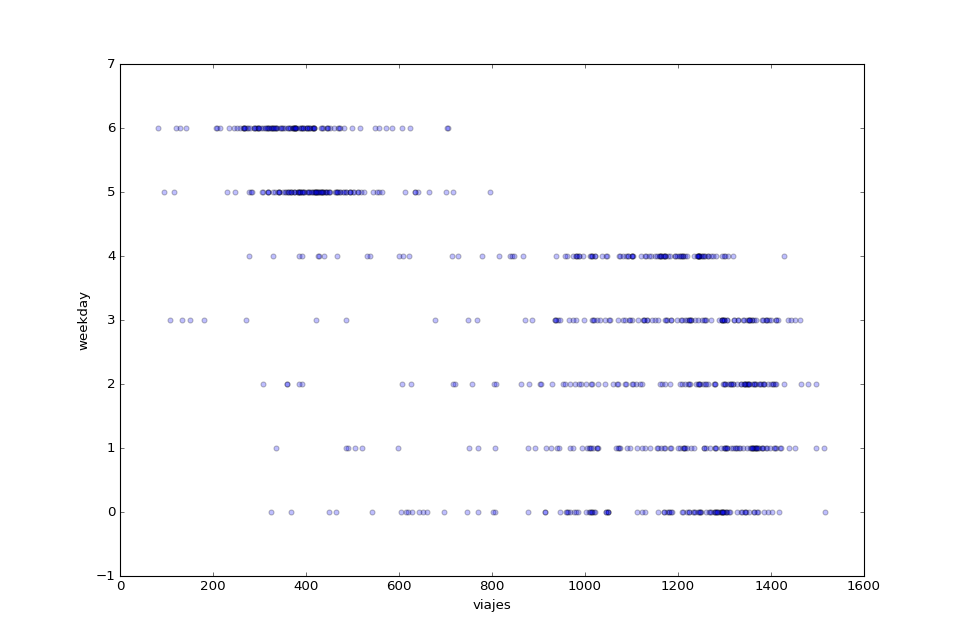

In [96]:
dfSF_Bay.plot.scatter('viajes','weekday',alpha=0.25,figsize=(12,8));

In [98]:
import seaborn as sns
fig, ax = plt.subplots(figsize=(16,5));        # Sample figsize in inches
cor = dfSF_BayHeatmap2.abs()
cor.values[[np.arange(5)]*2] = 0
sns.heatmap(cor,cmap='Oranges');

<IPython.core.display.Javascript object>

NameError: name 'dfSF_BayHeatmap2' is not defined

<IPython.core.display.Javascript object>


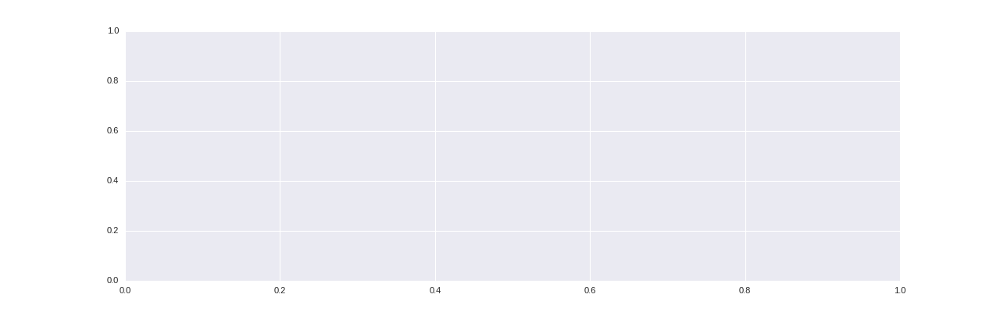

NameError: name 'dfSF_BayHeatmap1' is not defined

In [99]:
fig, ax = plt.subplots(figsize=(16,5));        # Sample figsize in inches
cor = dfSF_BayHeatmap1.abs()
cor.values[[np.arange(7)]*2] = 0
sns.heatmap(cor,cmap='Oranges');

# PARTE MATIAS

In [100]:
latPromedio = dfEstaciones.lat.mean()
longPromedio = dfEstaciones.long.mean()
cantidadTotalDeBicicletasSoportadas = dfEstaciones.dock_count.sum()
print cantidadTotalDeBicicletasSoportadas

1236


In [101]:
map1 = folium.Map(location=[latPromedio, longPromedio], tiles = "Stamen Terrain")
map1Copy = folium.Map(location=[latPromedio, longPromedio], tiles = "Stamen Terrain")
map2 = folium.Map(location=[latPromedio, longPromedio], tiles = "Stamen Terrain")
startStationMap = folium.Map(location=[latPromedio, longPromedio], tiles = "Stamen Terrain")
viajesEntreEstacionesMap = folium.Map(location=[latPromedio, longPromedio], tiles = "Stamen Terrain")

In [102]:
grupoDeUbicaciones = folium.FeatureGroup(name='Ubicación de estaciones 1')
for lat, lon, nombre in zip(dfEstaciones.lat, dfEstaciones.long, dfEstaciones.name):
    grupoDeUbicaciones.add_child(folium.Marker(location=[lat,lon], popup=nombre))
    
map1.add_child(grupoDeUbicaciones)

In [103]:
# Ahora intento version con MarkerCluster
# map1Copy.add_child(folium.MarkerCluster(locations=list(zip(dfEstaciones.long, dfEstaciones.lat))))

clusterDeUbicaciones = folium.MarkerCluster().add_to(map1Copy)
for lat, lon, nombre in zip(dfEstaciones.lat, dfEstaciones.long, dfEstaciones.name):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicaciones)
    
# map1.add_child(grupoDeUbicaciones)
map1Copy

In [104]:
grupoDeUbicacionesConCantidades = folium.FeatureGroup(name='Ubicación de estaciones')
for lat, lon, nombre, cantidadDeBicicletasSoportadas in zip(dfEstaciones.lat, dfEstaciones.long, dfEstaciones.name, dfEstaciones.dock_count):
    grupoDeUbicacionesConCantidades.add_child(folium.CircleMarker(location=[lat,lon], popup=nombre, 
                                                     radius=cantidadDeBicicletasSoportadas, 
                                                     fill_color='#b3ffb3', color='#00ff00'))
    
map2.add_child(grupoDeUbicacionesConCantidades)

In [105]:
dfStartStationCount = dfViajes[['id', 'start_station_id']].groupby(by='start_station_id', as_index=False)\
                                                .count().rename(columns={'id': 'cantidad_de_partidas'})
dfStartStationCount

,start_station_id,cantidad_de_partidas
0,2,9558
1,3,1594
2,4,3861
3,5,1257
4,6,2917
5,7,2233
6,8,1692
7,9,1910
8,10,2393
9,11,2034


In [106]:
dfPartidas = dfEstaciones[['id', 'lat', 'long', 'name']].merge(pd.DataFrame(dfStartStationCount), \
         left_on='id', right_on='start_station_id', how='right')
dfPartidas

,id,lat,long,name,start_station_id,cantidad_de_partidas
0,2,37.329732,-121.901782,San Jose Diridon Caltrain Station,2,9558
1,3,37.330698,-121.888979,San Jose Civic Center,3,1594
2,4,37.333988,-121.894902,Santa Clara at Almaden,4,3861
3,5,37.331415,-121.893200,Adobe on Almaden,5,1257
4,6,37.336721,-121.894074,San Pedro Square,6,2917
5,7,37.333798,-121.886943,Paseo de San Antonio,7,2233
6,8,37.330165,-121.885831,San Salvador at 1st,8,1692
7,9,37.348742,-121.894715,Japantown,9,1910
8,10,37.337391,-121.886995,San Jose City Hall,10,2393
9,11,37.335885,-121.885660,MLK Library,11,2034


In [107]:
cantidad_de_partidas_maxima = dfPartidas.cantidad_de_partidas.max()
cantidad_de_partidas_maxima

49092

In [108]:
grupoDeUbicacionesConCantidadesDePartidas = folium.FeatureGroup(name='Ubicación de estaciones con infor de #partidas')
for lat, lon, nombre, cant in zip(dfPartidas.lat, dfPartidas.long, dfPartidas.name, dfPartidas.cantidad_de_partidas):
    grupoDeUbicacionesConCantidadesDePartidas.add_child(folium.CircleMarker(location=[lat,lon], popup=nombre, 
                                                     radius=cant/1000,
                                                     fill_color='#8A2BE2', color='#00ff00'))
    
startStationMap.add_child(grupoDeUbicacionesConCantidadesDePartidas)

In [109]:
# df = pd.DataFrame(columns=['start_station_id', 'start_station_lat', 'start_station_lon',
#                            'end_station_id', 'end_station_lat', 'end_station_lon'])
# df.start_station_id = dfViajes.start_station_id
# df
# dfStartStationCount['start_station_lat'] = dfEstaciones['lat']
# dfStartStationCount['start_station_lon'] = dfEstaciones['long']
# dfStartStationCount['name'] = dfEstaciones['name']
# for idEstacionSalida in dfStartStationCount.index.tolist():
#     dfStartStationCount['start_station_lat'] = dfEstaciones.loc[dfEstaciones.id == idEstacionSalida, 'lat'] 
# dfStartStationCount

In [110]:
# grupoDeUbicacionesConCantidades = folium.FeatureGroup(name='Ubicación de estaciones')
# for lat, lon, nombre, cantidadDeBicicletasSoportadas in zip(dfEstaciones.lat, dfEstaciones.long, dfEstaciones.name, dfEstaciones.dock_count):
#     grupoDeUbicacionesConCantidades.add_child(folium.CircleMarker(location=[lat,lon], popup=nombre, 
#                                                      radius=cantidadDeBicicletasSoportadas, 
#                                                      fill_color='#b3ffb3', color='#00ff00'))
    
# map2.add_child(grupoDeUbicacionesConCantidades)

In [111]:
dfViajesEntreEstaciones = dfViajes[['id', 'start_station_id', 'end_station_id']]\
        .groupby(by=['start_station_id', 'end_station_id'], as_index=False)\
        .count().rename(columns={'id': 'cantidad'})
dfViajesEntreEstaciones

,start_station_id,end_station_id,cantidad
0,2,2,191
1,2,3,448
2,2,4,2200
3,2,5,627
4,2,6,1274
5,2,7,1007
6,2,8,228
7,2,9,634
8,2,10,519
9,2,11,808


In [112]:
dfViajesEntreEstaciones = dfViajesEntreEstaciones.merge(right=dfEstaciones[['lat', 'long', 'id', 'name', 'city']], \
                              left_on='start_station_id', right_on='id')\
                            .drop(['id'], 1).rename(columns={'lat': 'start_station_lat', 'long': \
                                                          'start_station_long', 'name': 'start_station_name', \
                                                             'city': 'start_city'})

In [113]:
dfViajesEntreEstaciones = dfViajesEntreEstaciones.merge(right=dfEstaciones[['lat', 'long', 'id', 'name', 'city']], \
                              left_on='end_station_id', right_on='id')\
                            .drop(['id'], 1).rename(columns={'lat': 'end_station_lat', 'long': \
                                                          'end_station_long', 'name': 'end_station_name', \
                                                             'city': 'end_city'})
dfViajesEntreEstaciones.sort_values(by='cantidad', ascending=True)

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,start_city,end_station_lat,end_station_long,end_station_name,end_city
200,28,13,1,37.394358,-122.076713,Mountain View Caltrain Station,Mountain View,37.339301,-121.889937,St James Park,San Jose
548,26,83,1,37.487682,-122.223492,Redwood City Medical Center,Redwood City,37.491269,-122.236234,Mezes Park,Redwood City
355,4,70,1,37.333988,-121.894902,Santa Clara at Almaden,San Jose,37.776617,-122.395260,San Francisco Caltrain (Townsend at 4th),San Francisco
357,28,70,1,37.394358,-122.076713,Mountain View Caltrain Station,Mountain View,37.776617,-122.395260,San Francisco Caltrain (Townsend at 4th),San Francisco
358,31,70,1,37.400443,-122.108338,San Antonio Shopping Center,Mountain View,37.776617,-122.395260,San Francisco Caltrain (Townsend at 4th),San Francisco
267,2,37,1,37.329732,-121.901782,San Jose Diridon Caltrain Station,San Jose,37.448598,-122.159504,Cowper at University,Palo Alto
361,36,70,1,37.429082,-122.142805,California Ave Caltrain Station,Palo Alto,37.776617,-122.395260,San Francisco Caltrain (Townsend at 4th),San Francisco
362,38,70,1,37.425684,-122.137777,Park at Olive,Palo Alto,37.776617,-122.395260,San Francisco Caltrain (Townsend at 4th),San Francisco
549,56,83,1,37.792251,-122.397086,Beale at Market,San Francisco,37.491269,-122.236234,Mezes Park,Redwood City
541,39,35,1,37.783871,-122.408433,Powell Street BART,San Francisco,37.444521,-122.163093,University and Emerson,Palo Alto


In [114]:
dfViajesEntreEstaciones.cantidad.describe()

count    1751.000000
mean      382.615077
std       592.419146
min         1.000000
25%        71.500000
50%       191.000000
75%       440.000000
max      6216.000000
Name: cantidad, dtype: float64

## Analizo distribucion de datos

In [115]:
import seaborn as sns

In [122]:
dfViajesEntreEstaciones.describe()

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,end_station_lat,end_station_long
count,1751.000000,1751.000000,1751.000000,1751.000000,1751.000000,1751.000000,1751.000000
mean,49.762993,49.991433,382.615077,37.669703,-122.288592,37.670282,-122.288692
std,22.016548,21.997310,592.419146,0.186272,0.190619,0.186236,0.190973
min,2.000000,2.000000,1.000000,37.329732,-122.418954,37.329732,-122.418954
25%,36.000000,37.000000,71.500000,37.481758,-122.403234,37.448598,-122.403234
50%,55.000000,55.000000,191.000000,37.782259,-122.396236,37.782259,-122.396236
75%,67.000000,68.000000,440.000000,37.791300,-122.203288,37.791300,-122.164759
max,84.000000,84.000000,6216.000000,37.804770,-121.877349,37.804770,-121.877349


<IPython.core.display.Javascript object>


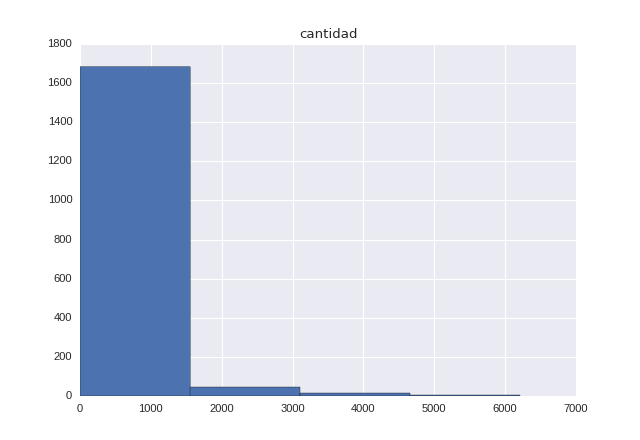

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6b48fe8550>]], dtype=object)

In [124]:
dfViajesEntreEstaciones.filter(items=['start_station_id', 'cantidad']).hist('cantidad', bins=4)

In [125]:
maxCantidadDeViajes = dfViajesEntreEstaciones.cantidad.max()
promedioCantidadDeViajes = dfViajesEntreEstaciones.cantidad.mean()
dfViajesEntreEstaciones.cantidad.max()

6216

In [126]:
# colores = cm.LinearColormap(['green', 'orange', 'red'], vmax=maxCantidadDeViajes, 
#                   index=[0, promedioCantidadDeViajes, maxCantidadDeViajes])

# colores = cm.LinearColormap(['red', 'orange', 'yellow', 'green'], vmax = maxCantidadDeViajes)

colores = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=maxCantidadDeViajes, index=[1, 1500, 3100, 4650, maxCantidadDeViajes],
                       caption='step')
colores.caption = 'Cantidad de viajes entre estaciones'
# colores = cm.linear.Set1.scale(0, maxCantidadDeViajes).to_step(
# #     n=4,
#     index=[1, 71.5, 191, 440, 6216],
# #     method='quantiles',
# #     round_method='int'
# )
# colores.to_linear()
colores2 = cm.linear.YlGn.scale(0, 6000)
#colores3 = cm.linear.RdGy.to_step(100).scale(0, 6000)


colores

In [127]:
linesMap = folium.Map(location=[latPromedio, longPromedio], tiles = "Stamen Terrain")
linesMap.add_child(colores)

In [128]:
clusterDeUbicaciones = folium.MarkerCluster().add_to(linesMap)
for lat, lon, nombre in zip(dfEstaciones.lat, dfEstaciones.long, dfEstaciones.name):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicaciones)

In [129]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstaciones.start_station_lat,\
                                                                       dfViajesEntreEstaciones.start_station_long,\
                                                                       dfViajesEntreEstaciones.start_station_name,\
                                                                       dfViajesEntreEstaciones.end_station_lat,\
                                                                       dfViajesEntreEstaciones.end_station_long,\
                                                                       dfViajesEntreEstaciones.end_station_name,\
                                                                       dfViajesEntreEstaciones.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=colores(cant), weight=3, opacity=1).add_to(linesMap)
#     linesMap.add_child(c)
    
# startStationMap.add_child(grupoDeViajesEntreEstaciones)
linesMap

In [130]:
dfViajesEntreEstaciones.start_city.unique()

array(['San Jose', 'Mountain View', 'San Francisco', 'Redwood City',
       'Palo Alto'], dtype=object)

# Mapa con viajes en San Jose

In [131]:
dfViajesEntreEstacionesEnSanJose = (dfViajesEntreEstaciones[dfViajesEntreEstaciones.start_city == 'San Jose']).drop('start_city', 1)
dfViajesEntreEstacionesEnSanJose = (dfViajesEntreEstacionesEnSanJose[dfViajesEntreEstacionesEnSanJose.end_city == 'San Jose']).drop('end_city', 1)
dfViajesEntreEstacionesEnSanJose

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
0,2,2,191,37.329732,-121.901782,San Jose Diridon Caltrain Station,37.329732,-121.901782,San Jose Diridon Caltrain Station
1,3,2,381,37.330698,-121.888979,San Jose Civic Center,37.329732,-121.901782,San Jose Diridon Caltrain Station
2,4,2,2283,37.333988,-121.894902,Santa Clara at Almaden,37.329732,-121.901782,San Jose Diridon Caltrain Station
3,5,2,687,37.331415,-121.893200,Adobe on Almaden,37.329732,-121.901782,San Jose Diridon Caltrain Station
4,6,2,1172,37.336721,-121.894074,San Pedro Square,37.329732,-121.901782,San Jose Diridon Caltrain Station
5,7,2,695,37.333798,-121.886943,Paseo de San Antonio,37.329732,-121.901782,San Jose Diridon Caltrain Station
6,8,2,261,37.330165,-121.885831,San Salvador at 1st,37.329732,-121.901782,San Jose Diridon Caltrain Station
7,9,2,438,37.348742,-121.894715,Japantown,37.329732,-121.901782,San Jose Diridon Caltrain Station
8,10,2,716,37.337391,-121.886995,San Jose City Hall,37.329732,-121.901782,San Jose Diridon Caltrain Station
9,11,2,806,37.335885,-121.885660,MLK Library,37.329732,-121.901782,San Jose Diridon Caltrain Station


In [132]:
latSanJosePromedio = dfViajesEntreEstacionesEnSanJose.start_station_lat.mean()
longSanJosePromedio = dfViajesEntreEstacionesEnSanJose.start_station_long.mean()

In [133]:
viajesEntreEstacionesEnSanJoseMap = folium.Map(location=[latSanJosePromedio, longSanJosePromedio], tiles = "Stamen Terrain", zoom_start=14)
viajesEntreEstacionesEnSanJoseMap

In [134]:
dfViajesEntreEstacionesEnSanJose.cantidad.describe()

count     256.000000
mean      147.875000
std       265.645023
min         3.000000
25%        32.000000
50%        65.000000
75%       135.250000
max      2283.000000
Name: cantidad, dtype: float64

In [135]:
maxCantidadDeViajesEnSanJose = dfViajesEntreEstacionesEnSanJose.cantidad.max()
# promedioCantidadDeViajesEnSanJose = dfViajesEntreEstacionesEnSanJose.cantidad.mean()

In [136]:
coloresSanJose = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=maxCantidadDeViajesEnSanJose, index=[3, 32, 65, 135, maxCantidadDeViajesEnSanJose],
                       caption='step')
coloresSanJose.caption = 'Cantidad de viajes entre estaciones en San Jose'
coloresSanJose
coloresSanJose2 = cm.linear.YlGn.scale(0, maxCantidadDeViajesEnSanJose)

In [137]:
viajesEntreEstacionesEnSanJoseMap.add_child(coloresSanJose)

In [138]:
clusterDeUbicacionesSanJose = folium.MarkerCluster().add_to(viajesEntreEstacionesEnSanJoseMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnSanJose.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnSanJose.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnSanJose.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesSanJose)

In [139]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnSanJose.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanJose.start_station_long,\
                                                                       dfViajesEntreEstacionesEnSanJose.start_station_name,\
                                                                       dfViajesEntreEstacionesEnSanJose.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanJose.end_station_long,\
                                                                       dfViajesEntreEstacionesEnSanJose.end_station_name,\
                                                                       dfViajesEntreEstacionesEnSanJose.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresSanJose(cant), weight=3, opacity=1).add_to(viajesEntreEstacionesEnSanJoseMap)
viajesEntreEstacionesEnSanJoseMap

### Grafico con n estaciones mas activas

In [236]:
n = 20

In [237]:
cotaInferiorSanJose = dfViajesEntreEstacionesEnSanJose.cantidad.nlargest (n).min()

In [238]:
dfViajesEntreEstacionesEnSanJoseTopN = dfViajesEntreEstacionesEnSanJose[dfViajesEntreEstacionesEnSanJose['cantidad'] \
                                                                        >= cotaInferiorSanJose]
dfViajesEntreEstacionesEnSanJoseTopN

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
2,4,2,2283,37.333988,-121.894902,Santa Clara at Almaden,37.329732,-121.901782,San Jose Diridon Caltrain Station
3,5,2,687,37.331415,-121.893200,Adobe on Almaden,37.329732,-121.901782,San Jose Diridon Caltrain Station
4,6,2,1172,37.336721,-121.894074,San Pedro Square,37.329732,-121.901782,San Jose Diridon Caltrain Station
5,7,2,695,37.333798,-121.886943,Paseo de San Antonio,37.329732,-121.901782,San Jose Diridon Caltrain Station
7,9,2,438,37.348742,-121.894715,Japantown,37.329732,-121.901782,San Jose Diridon Caltrain Station
8,10,2,716,37.337391,-121.886995,San Jose City Hall,37.329732,-121.901782,San Jose Diridon Caltrain Station
9,11,2,806,37.335885,-121.885660,MLK Library,37.329732,-121.901782,San Jose Diridon Caltrain Station
11,13,2,645,37.339301,-121.889937,St James Park,37.329732,-121.901782,San Jose Diridon Caltrain Station
18,84,2,546,37.342725,-121.895617,Ryland Park,37.329732,-121.901782,San Jose Diridon Caltrain Station
19,2,3,448,37.329732,-121.901782,San Jose Diridon Caltrain Station,37.330698,-121.888979,San Jose Civic Center


In [239]:
topViajesEntreEstacionesEnSanJoseMap = folium.Map(location=[latSanJosePromedio, longSanJosePromedio], tiles = "Stamen Terrain", zoom_start=14)
topViajesEntreEstacionesEnSanJoseMap

In [240]:
dfViajesEntreEstacionesEnSanJoseTopN.cantidad.describe()

count      20.000000
mean      859.800000
std       521.822071
min       438.000000
25%       552.000000
50%       666.000000
75%       857.750000
max      2283.000000
Name: cantidad, dtype: float64

In [241]:
coloresSanJoseTopN = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=maxCantidadDeViajesEnSanJose, index=[438, 552, 666, 857, maxCantidadDeViajesEnSanJose],
                       caption='step')
coloresSanJoseTopN.caption = 'Cantidad de viajes entre estaciones en San Jose'

coloresSanJoseTopN2 = cm.linear.YlGn.scale(0, maxCantidadDeViajesEnSanJose)

coloresSanJoseTopN

In [242]:
topViajesEntreEstacionesEnSanJoseMap.add_child(coloresSanJoseTopN)

In [243]:
clusterDeUbicacionesSanJose = folium.MarkerCluster().add_to(topViajesEntreEstacionesEnSanJoseMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnSanJose.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnSanJose.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnSanJose.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesSanJose)

In [244]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnSanJoseTopN.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanJoseTopN.start_station_long,\
                                                                       dfViajesEntreEstacionesEnSanJoseTopN.start_station_name,\
                                                                       dfViajesEntreEstacionesEnSanJoseTopN.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanJoseTopN.end_station_long,\
                                                                       dfViajesEntreEstacionesEnSanJoseTopN.end_station_name,\
                                                                       dfViajesEntreEstacionesEnSanJoseTopN.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresSanJoseTopN(cant), weight=5, opacity=1).add_to(topViajesEntreEstacionesEnSanJoseMap)
topViajesEntreEstacionesEnSanJoseMap

### Grafico con n estaciones menos activas

In [227]:
n = 20

In [228]:
cotaSuperiorSanJose = dfViajesEntreEstacionesEnSanJose.cantidad.nsmallest(n).max()

In [229]:
dfViajesEntreEstacionesEnSanJoseBottomN = dfViajesEntreEstacionesEnSanJose[dfViajesEntreEstacionesEnSanJose['cantidad'] \
                                                                        <= cotaSuperiorSanJose]
dfViajesEntreEstacionesEnSanJoseBottomN

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
34,80,3,9,37.352601,-121.905733,Santa Clara County Civic Center,37.330698,-121.888979,San Jose Civic Center
50,80,4,8,37.352601,-121.905733,Santa Clara County Civic Center,37.333988,-121.894902,Santa Clara at Almaden
66,80,5,8,37.352601,-121.905733,Santa Clara County Civic Center,37.331415,-121.893200,Adobe on Almaden
67,84,5,12,37.342725,-121.895617,Ryland Park,37.331415,-121.893200,Adobe on Almaden
99,80,7,6,37.352601,-121.905733,Santa Clara County Civic Center,37.333798,-121.886943,Paseo de San Antonio
116,80,8,3,37.352601,-121.905733,Santa Clara County Civic Center,37.330165,-121.885831,San Salvador at 1st
117,84,8,13,37.342725,-121.895617,Ryland Park,37.330165,-121.885831,San Salvador at 1st
167,80,11,13,37.352601,-121.905733,Santa Clara County Civic Center,37.335885,-121.885660,MLK Library
183,80,12,4,37.352601,-121.905733,Santa Clara County Civic Center,37.332808,-121.883891,SJSU 4th at San Carlos
235,80,16,12,37.352601,-121.905733,Santa Clara County Civic Center,37.333955,-121.877349,SJSU - San Salvador at 9th


In [230]:
bottomViajesEntreEstacionesEnSanJoseMap = folium.Map(location=[latSanJosePromedio, longSanJosePromedio], tiles = "Stamen Terrain", zoom_start=14)
bottomViajesEntreEstacionesEnSanJoseMap

In [231]:
dfViajesEntreEstacionesEnSanJoseBottomN.cantidad.describe()

count    20.000000
mean      7.950000
std       3.300319
min       3.000000
25%       5.000000
50%       8.500000
75%      10.250000
max      13.000000
Name: cantidad, dtype: float64

In [232]:
coloresSanJoseBottomN = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=13, index=[3, 5, 8, 10, 13],
                       caption='step')
coloresSanJoseBottomN.caption = 'Cantidad de viajes entre estaciones con menos viajes entre ellas en San Jose'

coloresSanJoseBottomN2 = cm.linear.YlGn.scale(0, 13)

coloresSanJoseBottomN

In [233]:
bottomViajesEntreEstacionesEnSanJoseMap.add_child(coloresSanJoseBottomN)

In [234]:
clusterDeUbicacionesSanJose = folium.MarkerCluster().add_to(bottomViajesEntreEstacionesEnSanJoseMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnSanJose.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnSanJose.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnSanJose.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesSanJose)

In [235]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnSanJoseBottomN.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanJoseBottomN.start_station_long,\
                                                                       dfViajesEntreEstacionesEnSanJoseBottomN.start_station_name,\
                                                                       dfViajesEntreEstacionesEnSanJoseBottomN.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanJoseBottomN.end_station_long,\
                                                                       dfViajesEntreEstacionesEnSanJoseBottomN.end_station_name,\
                                                                       dfViajesEntreEstacionesEnSanJoseBottomN.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresSanJoseBottomN(cant), weight=5, opacity=1).add_to(bottomViajesEntreEstacionesEnSanJoseMap)
bottomViajesEntreEstacionesEnSanJoseMap

# Mapa con viajes en Mountain View

In [158]:
dfViajesEntreEstacionesEnMountainView = (dfViajesEntreEstaciones[dfViajesEntreEstaciones.start_city == 'Mountain View']).drop('start_city', 1)
dfViajesEntreEstacionesEnMountainView = (dfViajesEntreEstacionesEnMountainView[dfViajesEntreEstacionesEnMountainView.end_city == 'Mountain View']).drop('end_city', 1)
dfViajesEntreEstacionesEnMountainView

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
241,27,28,2401,37.389218,-122.081896,Mountain View City Hall,37.394358,-122.076713,Mountain View Caltrain Station
242,28,28,528,37.394358,-122.076713,Mountain View Caltrain Station,37.394358,-122.076713,Mountain View Caltrain Station
243,29,28,105,37.406940,-122.106758,San Antonio Caltrain Station,37.394358,-122.076713,Mountain View Caltrain Station
244,30,28,1337,37.390277,-122.066553,Evelyn Park and Ride,37.394358,-122.076713,Mountain View Caltrain Station
245,31,28,176,37.400443,-122.108338,San Antonio Shopping Center,37.394358,-122.076713,Mountain View Caltrain Station
246,32,28,1677,37.385956,-122.083678,Castro Street and El Camino Real,37.394358,-122.076713,Mountain View Caltrain Station
247,33,28,430,37.400241,-122.099076,Rengstorff Avenue / California Street,37.394358,-122.076713,Mountain View Caltrain Station
255,27,33,108,37.389218,-122.081896,Mountain View City Hall,37.400241,-122.099076,Rengstorff Avenue / California Street
256,28,33,399,37.394358,-122.076713,Mountain View Caltrain Station,37.400241,-122.099076,Rengstorff Avenue / California Street
257,29,33,280,37.406940,-122.106758,San Antonio Caltrain Station,37.400241,-122.099076,Rengstorff Avenue / California Street


In [159]:
latMountainViewPromedio = dfViajesEntreEstacionesEnMountainView.start_station_lat.mean()
longMountainViewPromedio = dfViajesEntreEstacionesEnMountainView.start_station_long.mean()

In [160]:
viajesEntreEstacionesEnMountainViewMap = folium.Map(location=[latMountainViewPromedio, longMountainViewPromedio], tiles = "Stamen Terrain", zoom_start=14)
viajesEntreEstacionesEnMountainViewMap

In [161]:
dfViajesEntreEstacionesEnMountainView.cantidad.describe()

count      49.000000
mean      362.163265
std       625.667255
min         2.000000
25%        30.000000
50%       101.000000
75%       280.000000
max      2666.000000
Name: cantidad, dtype: float64

In [162]:
maxCantidadDeViajesEnMountainView = dfViajesEntreEstacionesEnMountainView.cantidad.max()

In [163]:
coloresMountainView = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=maxCantidadDeViajesEnMountainView, index=[2, 30, 101, 280, maxCantidadDeViajesEnMountainView],
                       caption='step')
coloresMountainView.caption = 'Cantidad de viajes entre estaciones en Mountain View'
coloresMountainView
coloresSanJose2 = cm.linear.YlGn.scale(0, maxCantidadDeViajesEnMountainView)

In [164]:
viajesEntreEstacionesEnMountainViewMap.add_child(coloresMountainView)

In [165]:
clusterDeUbicacionesMountainView = folium.MarkerCluster().add_to(viajesEntreEstacionesEnMountainViewMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnMountainView.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnMountainView.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnMountainView.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesMountainView)

In [166]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnMountainView.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnMountainView.start_station_long,\
                                                                       dfViajesEntreEstacionesEnMountainView.start_station_name,\
                                                                       dfViajesEntreEstacionesEnMountainView.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnMountainView.end_station_long,\
                                                                       dfViajesEntreEstacionesEnMountainView.end_station_name,\
                                                                       dfViajesEntreEstacionesEnMountainView.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresMountainView(cant), weight=3, opacity=1).add_to(viajesEntreEstacionesEnMountainViewMap)
viajesEntreEstacionesEnMountainViewMap

### Grafico con n estaciones mas activas

In [236]:
n = 20

In [245]:
cotaInferiorMountainView = dfViajesEntreEstacionesEnMountainView.cantidad.nlargest (n).min()

In [246]:
dfViajesEntreEstacionesEnMountainViewTopN = dfViajesEntreEstacionesEnMountainView[dfViajesEntreEstacionesEnMountainView['cantidad'] \
                                                                        >= cotaInferiorMountainView]
dfViajesEntreEstacionesEnMountainViewTopN

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
241,27,28,2401,37.389218,-122.081896,Mountain View City Hall,37.394358,-122.076713,Mountain View Caltrain Station
242,28,28,528,37.394358,-122.076713,Mountain View Caltrain Station,37.394358,-122.076713,Mountain View Caltrain Station
244,30,28,1337,37.390277,-122.066553,Evelyn Park and Ride,37.394358,-122.076713,Mountain View Caltrain Station
245,31,28,176,37.400443,-122.108338,San Antonio Shopping Center,37.394358,-122.076713,Mountain View Caltrain Station
246,32,28,1677,37.385956,-122.083678,Castro Street and El Camino Real,37.394358,-122.076713,Mountain View Caltrain Station
247,33,28,430,37.400241,-122.099076,Rengstorff Avenue / California Street,37.394358,-122.076713,Mountain View Caltrain Station
256,28,33,399,37.394358,-122.076713,Mountain View Caltrain Station,37.400241,-122.099076,Rengstorff Avenue / California Street
257,29,33,280,37.406940,-122.106758,San Antonio Caltrain Station,37.400241,-122.099076,Rengstorff Avenue / California Street
261,33,33,160,37.400241,-122.099076,Rengstorff Avenue / California Street,37.400241,-122.099076,Rengstorff Avenue / California Street
438,28,31,187,37.394358,-122.076713,Mountain View Caltrain Station,37.400443,-122.108338,San Antonio Shopping Center


In [247]:
topViajesEntreEstacionesEnMountainViewMap = folium.Map(location=[latMountainViewPromedio, longMountainViewPromedio], tiles = "Stamen Terrain", zoom_start=14)
topViajesEntreEstacionesEnMountainViewMap

In [248]:
dfViajesEntreEstacionesEnMountainViewTopN.cantidad.describe()

count      20.000000
mean      816.050000
std       787.519589
min       140.000000
25%       185.250000
50%       414.500000
75%      1292.750000
max      2666.000000
Name: cantidad, dtype: float64

In [249]:
coloresMountainViewTopN = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=maxCantidadDeViajesEnMountainView, index=[140, 185, 414, 1292, maxCantidadDeViajesEnMountainView],
                       caption='step')
coloresMountainViewTopN.caption = 'Cantidad de viajes entre estaciones mas frecuentes en Mountain View'

coloresMountainViewTopN2 = cm.linear.YlGn.scale(0, maxCantidadDeViajesEnMountainView)

coloresMountainViewTopN

In [250]:
topViajesEntreEstacionesEnMountainViewMap.add_child(coloresMountainViewTopN)

In [251]:
clusterDeUbicacionesMountainView = folium.MarkerCluster().add_to(topViajesEntreEstacionesEnMountainViewMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnMountainView.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnMountainView.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnMountainView.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesMountainView)

In [252]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnMountainViewTopN.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnMountainViewTopN.start_station_long,\
                                                                       dfViajesEntreEstacionesEnMountainViewTopN.start_station_name,\
                                                                       dfViajesEntreEstacionesEnMountainViewTopN.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnMountainViewTopN.end_station_long,\
                                                                       dfViajesEntreEstacionesEnMountainViewTopN.end_station_name,\
                                                                       dfViajesEntreEstacionesEnMountainViewTopN.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresMountainViewTopN(cant), weight=5, opacity=1).add_to(topViajesEntreEstacionesEnMountainViewMap)
topViajesEntreEstacionesEnMountainViewMap

### Grafico con n estaciones menos activas

In [253]:
n = 20

In [254]:
cotaSuperiorMountainView = dfViajesEntreEstacionesEnMountainView.cantidad.nsmallest(n).max()

In [255]:
dfViajesEntreEstacionesEnMountainViewBottomN = dfViajesEntreEstacionesEnMountainView[dfViajesEntreEstacionesEnMountainView['cantidad'] \
                                                                        <= cotaSuperiorMountainView]
dfViajesEntreEstacionesEnMountainViewBottomN

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
258,30,33,8,37.390277,-122.066553,Evelyn Park and Ride,37.400241,-122.099076,Rengstorff Avenue / California Street
260,32,33,16,37.385956,-122.083678,Castro Street and El Camino Real,37.400241,-122.099076,Rengstorff Avenue / California Street
437,27,31,67,37.389218,-122.081896,Mountain View City Hall,37.400443,-122.108338,San Antonio Shopping Center
440,30,31,4,37.390277,-122.066553,Evelyn Park and Ride,37.400443,-122.108338,San Antonio Shopping Center
442,32,31,47,37.385956,-122.083678,Castro Street and El Camino Real,37.400443,-122.108338,San Antonio Shopping Center
443,33,31,63,37.400241,-122.099076,Rengstorff Avenue / California Street,37.400443,-122.108338,San Antonio Shopping Center
552,27,29,44,37.389218,-122.081896,Mountain View City Hall,37.406940,-122.106758,San Antonio Caltrain Station
555,30,29,6,37.390277,-122.066553,Evelyn Park and Ride,37.406940,-122.106758,San Antonio Caltrain Station
557,32,29,12,37.385956,-122.083678,Castro Street and El Camino Real,37.406940,-122.106758,San Antonio Caltrain Station
596,29,32,8,37.406940,-122.106758,San Antonio Caltrain Station,37.385956,-122.083678,Castro Street and El Camino Real


In [256]:
bottomViajesEntreEstacionesEnMountainViewMap = folium.Map(location=[latMountainViewPromedio, longMountainViewPromedio], tiles = "Stamen Terrain", zoom_start=14)
bottomViajesEntreEstacionesEnMountainViewMap

In [257]:
dfViajesEntreEstacionesEnMountainViewBottomN.cantidad.describe()

count    20.000000
mean     27.050000
std      22.177454
min       2.000000
25%       7.750000
50%      20.500000
75%      44.750000
max      67.000000
Name: cantidad, dtype: float64

In [258]:
coloresMountainViewBottomN = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=67, index=[2, 8, 21, 45, 67],
                       caption='step')
coloresMountainViewBottomN.caption = 'Cantidad de viajes entre estaciones con menos viajes entre ellas en Mountain View'

coloresMountainViewBottomN2 = cm.linear.YlGn.scale(0, 67)

coloresMountainViewBottomN

In [259]:
bottomViajesEntreEstacionesEnMountainViewMap.add_child(coloresMountainViewBottomN)

In [260]:
clusterDeUbicacionesMountainView = folium.MarkerCluster().add_to(bottomViajesEntreEstacionesEnMountainViewMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnMountainView.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnMountainView.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnMountainView.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesMountainView)

In [261]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnMountainViewBottomN.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnMountainViewBottomN.start_station_long,\
                                                                       dfViajesEntreEstacionesEnMountainViewBottomN.start_station_name,\
                                                                       dfViajesEntreEstacionesEnMountainViewBottomN.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnMountainViewBottomN.end_station_long,\
                                                                       dfViajesEntreEstacionesEnMountainViewBottomN.end_station_name,\
                                                                       dfViajesEntreEstacionesEnMountainViewBottomN.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresMountainViewBottomN(cant), weight=5, opacity=1).add_to(bottomViajesEntreEstacionesEnMountainViewMap)
bottomViajesEntreEstacionesEnMountainViewMap

# Mapa con viajes en San Francisco

In [167]:
dfViajesEntreEstacionesEnSanFrancisco = (dfViajesEntreEstaciones[dfViajesEntreEstaciones.start_city == 'San Francisco']).drop('start_city', 1)
dfViajesEntreEstacionesEnSanFrancisco = (dfViajesEntreEstacionesEnSanFrancisco[dfViajesEntreEstacionesEnSanFrancisco.end_city == 'San Francisco']).drop('end_city', 1)
dfViajesEntreEstacionesEnSanFrancisco

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
320,39,72,774,37.783871,-122.408433,Powell Street BART,37.781039,-122.411748,Civic Center BART (7th at Market)
321,41,72,161,37.795001,-122.399970,Clay at Battery,37.781039,-122.411748,Civic Center BART (7th at Market)
322,42,72,110,37.797280,-122.398436,Davis at Jackson,37.781039,-122.411748,Civic Center BART (7th at Market)
323,45,72,163,37.794231,-122.402923,Commercial at Montgomery,37.781039,-122.411748,Civic Center BART (7th at Market)
324,46,72,100,37.795425,-122.404767,Washington at Kearney,37.781039,-122.411748,Civic Center BART (7th at Market)
325,47,72,219,37.788975,-122.403452,Post at Kearney,37.781039,-122.411748,Civic Center BART (7th at Market)
326,48,72,112,37.799953,-122.398525,Embarcadero at Vallejo,37.781039,-122.411748,Civic Center BART (7th at Market)
327,49,72,97,37.790302,-122.390637,Spear at Folsom,37.781039,-122.411748,Civic Center BART (7th at Market)
328,50,72,171,37.795392,-122.394203,Harry Bridges Plaza (Ferry Building),37.781039,-122.411748,Civic Center BART (7th at Market)
329,51,72,52,37.791464,-122.391034,Embarcadero at Folsom,37.781039,-122.411748,Civic Center BART (7th at Market)


In [168]:
latSanFranciscoPromedio = dfViajesEntreEstacionesEnSanFrancisco.start_station_lat.mean()
longSanFranciscoPromedio = dfViajesEntreEstacionesEnSanFrancisco.start_station_long.mean()

In [169]:
viajesEntreEstacionesEnSanFranciscoMap = folium.Map(location=[latSanFranciscoPromedio, longSanFranciscoPromedio], tiles = "Stamen Terrain", zoom_start=14)
viajesEntreEstacionesEnSanFranciscoMap

In [170]:
dfViajesEntreEstacionesEnSanFrancisco.cantidad.describe()

count    1225.000000
mean      492.810612
std       652.207242
min         9.000000
25%       149.000000
50%       284.000000
75%       565.000000
max      6216.000000
Name: cantidad, dtype: float64

In [171]:
maxCantidadDeViajesEnSanFrancisco = dfViajesEntreEstacionesEnSanFrancisco.cantidad.max()

In [172]:
coloresSanFrancisco = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=maxCantidadDeViajesEnSanFrancisco, index=[9, 149, 284, 565, maxCantidadDeViajesEnSanFrancisco],
                       caption='step')
coloresSanFrancisco.caption = 'Cantidad de viajes entre estaciones en San Francisco'
coloresSanFrancisco
coloresSanFrancisco2 = cm.linear.YlGn.scale(0, maxCantidadDeViajesEnSanFrancisco)

In [173]:
viajesEntreEstacionesEnSanFranciscoMap.add_child(coloresSanFrancisco)

In [174]:
clusterDeUbicacionesSanFrancisco = folium.MarkerCluster().add_to(viajesEntreEstacionesEnSanFranciscoMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnSanFrancisco.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnSanFrancisco.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnSanFrancisco.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesSanFrancisco)

In [175]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnSanFrancisco.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanFrancisco.start_station_long,\
                                                                       dfViajesEntreEstacionesEnSanFrancisco.start_station_name,\
                                                                       dfViajesEntreEstacionesEnSanFrancisco.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanFrancisco.end_station_long,\
                                                                       dfViajesEntreEstacionesEnSanFrancisco.end_station_name,\
                                                                       dfViajesEntreEstacionesEnSanFrancisco.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresSanFrancisco(cant), weight=3, opacity=1).add_to(viajesEntreEstacionesEnSanFranciscoMap)
viajesEntreEstacionesEnSanFranciscoMap

### Grafico con n estaciones mas activas

In [262]:
n = 20

In [263]:
cotaInferiorSanFrancisco = dfViajesEntreEstacionesEnSanFrancisco.cantidad.nlargest (n).min()

In [264]:
dfViajesEntreEstacionesEnSanFranciscoTopN = dfViajesEntreEstacionesEnSanFrancisco[dfViajesEntreEstacionesEnSanFrancisco['cantidad'] \
                                                                        >= cotaInferiorSanFrancisco]
dfViajesEntreEstacionesEnSanFranciscoTopN

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
371,50,70,3033,37.795392,-122.394203,Harry Bridges Plaza (Ferry Building),37.776617,-122.395260,San Francisco Caltrain (Townsend at 4th)
372,51,70,3967,37.791464,-122.391034,Embarcadero at Folsom,37.776617,-122.395260,San Francisco Caltrain (Townsend at 4th)
374,55,70,3526,37.789756,-122.394643,Temporary Transbay Terminal (Howard at Beale),37.776617,-122.395260,San Francisco Caltrain (Townsend at 4th)
384,65,70,5041,37.771058,-122.402717,Townsend at 7th,37.776617,-122.395260,San Francisco Caltrain (Townsend at 4th)
386,67,70,3190,37.776619,-122.417385,Market at 10th,37.776617,-122.395260,San Francisco Caltrain (Townsend at 4th)
393,74,70,3477,37.794139,-122.394434,Steuart at Market,37.776617,-122.395260,San Francisco Caltrain (Townsend at 4th)
756,64,77,3627,37.782259,-122.392738,2nd at South Park,37.789625,-122.400811,Market at Sansome
796,69,39,3438,37.776600,-122.395470,San Francisco Caltrain 2 (330 Townsend),37.783871,-122.408433,Powell Street BART
1067,60,50,3231,37.804770,-122.403234,Embarcadero at Sansome,37.795392,-122.394203,Harry Bridges Plaza (Ferry Building)
1068,61,50,4839,37.780526,-122.390288,2nd at Townsend,37.795392,-122.394203,Harry Bridges Plaza (Ferry Building)


In [265]:
topViajesEntreEstacionesEnSanFranciscoMap = folium.Map(location=[latSanFranciscoPromedio, longSanFranciscoPromedio], tiles = "Stamen Terrain", zoom_start=14)
topViajesEntreEstacionesEnSanFranciscoMap

In [266]:
dfViajesEntreEstacionesEnSanFranciscoTopN.cantidad.describe()

count      20.000000
mean     3972.400000
std       930.753764
min      3033.000000
25%      3435.250000
50%      3574.000000
75%      4291.000000
max      6216.000000
Name: cantidad, dtype: float64

In [267]:
coloresSanFranciscoTopN = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=maxCantidadDeViajesEnSanFrancisco, index=[3033, 3435, 3574, 4291, maxCantidadDeViajesEnSanFrancisco],
                       caption='step')
coloresSanFranciscoTopN.caption = 'Cantidad de viajes entre estaciones en San Francisco'

coloresSanFranciscoTopN2 = cm.linear.YlGn.scale(0, maxCantidadDeViajesEnSanFrancisco)

coloresSanFranciscoTopN

In [268]:
topViajesEntreEstacionesEnSanFranciscoMap.add_child(coloresSanFranciscoTopN)

In [269]:
clusterDeUbicacionesSanFrancisco = folium.MarkerCluster().add_to(topViajesEntreEstacionesEnSanFranciscoMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnSanFrancisco.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnSanFrancisco.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnSanFrancisco.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesSanFrancisco)

In [270]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnSanFranciscoTopN.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanFranciscoTopN.start_station_long,\
                                                                       dfViajesEntreEstacionesEnSanFranciscoTopN.start_station_name,\
                                                                       dfViajesEntreEstacionesEnSanFranciscoTopN.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanFranciscoTopN.end_station_long,\
                                                                       dfViajesEntreEstacionesEnSanFranciscoTopN.end_station_name,\
                                                                       dfViajesEntreEstacionesEnSanFranciscoTopN.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresSanFranciscoTopN(cant), weight=5, opacity=1).add_to(topViajesEntreEstacionesEnSanFranciscoMap)
topViajesEntreEstacionesEnSanFranciscoMap

### Grafico con n estaciones menos activas

In [227]:
n = 20

In [271]:
cotaSuperiorSanFrancisco = dfViajesEntreEstacionesEnSanFrancisco.cantidad.nsmallest(n).max()

In [272]:
dfViajesEntreEstacionesEnSanFranciscoBottomN = dfViajesEntreEstacionesEnSanFrancisco[dfViajesEntreEstacionesEnSanFrancisco['cantidad'] \
                                                                        <= cotaSuperiorSanFrancisco]
dfViajesEntreEstacionesEnSanFranciscoBottomN

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
820,58,41,17,37.778650,-122.418235,San Francisco City Hall,37.795001,-122.399970,Clay at Battery
855,58,42,23,37.778650,-122.418235,San Francisco City Hall,37.797280,-122.398436,Davis at Jackson
856,59,42,26,37.781332,-122.418603,Golden Gate at Polk,37.797280,-122.398436,Davis at Jackson
995,58,48,15,37.778650,-122.418235,San Francisco City Hall,37.799953,-122.398525,Embarcadero at Vallejo
1100,58,51,11,37.778650,-122.418235,San Francisco City Hall,37.791464,-122.391034,Embarcadero at Folsom
1101,59,51,27,37.781332,-122.418603,Golden Gate at Polk,37.791464,-122.391034,Embarcadero at Folsom
1135,58,54,15,37.778650,-122.418235,San Francisco City Hall,37.787152,-122.388013,Embarcadero at Bryant
1228,42,58,23,37.797280,-122.398436,Davis at Jackson,37.778650,-122.418235,San Francisco City Hall
1232,48,58,30,37.799953,-122.398525,Embarcadero at Vallejo,37.778650,-122.418235,San Francisco City Hall
1233,49,58,26,37.790302,-122.390637,Spear at Folsom,37.778650,-122.418235,San Francisco City Hall


In [273]:
bottomViajesEntreEstacionesEnSanFranciscoMap = folium.Map(location=[latSanFranciscoPromedio, longSanFranciscoPromedio], tiles = "Stamen Terrain", zoom_start=14)
bottomViajesEntreEstacionesEnSanFranciscoMap

In [274]:
dfViajesEntreEstacionesEnSanFranciscoBottomN.cantidad.describe()

count    20.000000
mean     20.550000
std       6.557238
min       9.000000
25%      15.000000
50%      21.500000
75%      26.000000
max      30.000000
Name: cantidad, dtype: float64

In [275]:
coloresSanFranciscoBottomN = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=30, index=[9, 15, 21, 26, 30],
                       caption='step')
coloresSanFranciscoBottomN.caption = 'Cantidad de viajes entre estaciones con menos viajes entre ellas en San Francisco'

coloresSanFranciscoBottomN2 = cm.linear.YlGn.scale(0, 13)

coloresSanFranciscoBottomN

In [276]:
bottomViajesEntreEstacionesEnSanFranciscoMap.add_child(coloresSanFranciscoBottomN)

In [277]:
clusterDeUbicacionesSanFrancisco = folium.MarkerCluster().add_to(bottomViajesEntreEstacionesEnSanFranciscoMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnSanFrancisco.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnSanFrancisco.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnSanFrancisco.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesSanFrancisco)

In [278]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnSanFranciscoBottomN.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanFranciscoBottomN.start_station_long,\
                                                                       dfViajesEntreEstacionesEnSanFranciscoBottomN.start_station_name,\
                                                                       dfViajesEntreEstacionesEnSanFranciscoBottomN.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanFranciscoBottomN.end_station_long,\
                                                                       dfViajesEntreEstacionesEnSanFranciscoBottomN.end_station_name,\
                                                                       dfViajesEntreEstacionesEnSanFranciscoBottomN.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresSanFranciscoBottomN(cant), weight=5, opacity=1).add_to(bottomViajesEntreEstacionesEnSanFranciscoMap)
bottomViajesEntreEstacionesEnSanFranciscoMap

# Mapa con viajes en Redwood City

In [176]:
dfViajesEntreEstacionesEnRedwoodCity = (dfViajesEntreEstaciones[dfViajesEntreEstaciones.start_city == 'Redwood City']).drop('start_city', 1)
dfViajesEntreEstacionesEnRedwoodCity = (dfViajesEntreEstacionesEnRedwoodCity[dfViajesEntreEstacionesEnRedwoodCity.end_city == 'Redwood City']).drop('end_city', 1)
dfViajesEntreEstacionesEnRedwoodCity

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
450,21,21,38,37.481758,-122.226904,Franklin at Maple,37.481758,-122.226904,Franklin at Maple
451,22,21,167,37.486078,-122.232089,Redwood City Caltrain Station,37.481758,-122.226904,Franklin at Maple
452,23,21,6,37.487616,-122.229951,San Mateo County Center,37.481758,-122.226904,Franklin at Maple
453,24,21,22,37.484219,-122.227424,Redwood City Public Library,37.481758,-122.226904,Franklin at Maple
454,25,21,9,37.485370,-122.203288,Stanford in Redwood City,37.481758,-122.226904,Franklin at Maple
455,26,21,4,37.487682,-122.223492,Redwood City Medical Center,37.481758,-122.226904,Franklin at Maple
460,21,22,117,37.481758,-122.226904,Franklin at Maple,37.486078,-122.232089,Redwood City Caltrain Station
461,22,22,155,37.486078,-122.232089,Redwood City Caltrain Station,37.486078,-122.232089,Redwood City Caltrain Station
462,23,22,71,37.487616,-122.229951,San Mateo County Center,37.486078,-122.232089,Redwood City Caltrain Station
463,24,22,68,37.484219,-122.227424,Redwood City Public Library,37.486078,-122.232089,Redwood City Caltrain Station


In [177]:
latRedwoodCityPromedio = dfViajesEntreEstacionesEnRedwoodCity.start_station_lat.mean()
longRedwoodCityPromedio = dfViajesEntreEstacionesEnRedwoodCity.start_station_long.mean()

In [178]:
viajesEntreEstacionesEnRedwoodCityMap = folium.Map(location=[latRedwoodCityPromedio, longRedwoodCityPromedio], tiles = "Stamen Terrain", zoom_start=15)
viajesEntreEstacionesEnRedwoodCityMap

In [179]:
dfViajesEntreEstacionesEnRedwoodCity.cantidad.describe()

count     48.000000
mean      69.354167
std       97.705047
min        1.000000
25%        9.750000
50%       25.000000
75%       74.250000
max      371.000000
Name: cantidad, dtype: float64

In [180]:
maxCantidadDeViajesEnRedwoodCity = dfViajesEntreEstacionesEnRedwoodCity.cantidad.max()

In [181]:
coloresRedwoodCity = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=maxCantidadDeViajesEnRedwoodCity, index=[1, 9, 25, 74, maxCantidadDeViajesEnRedwoodCity],
                       caption='step')
coloresRedwoodCity.caption = 'Cantidad de viajes entre estaciones en Redwood City'
coloresRedwoodCity
coloresRedwoodCity2 = cm.linear.YlGn.scale(0, maxCantidadDeViajesEnRedwoodCity)

In [182]:
viajesEntreEstacionesEnRedwoodCityMap.add_child(coloresRedwoodCity)

In [183]:
clusterDeUbicacionesRedwoodCity = folium.MarkerCluster().add_to(viajesEntreEstacionesEnRedwoodCityMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnRedwoodCity.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnRedwoodCity.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnRedwoodCity.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesRedwoodCity)

In [184]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnRedwoodCity.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnRedwoodCity.start_station_long,\
                                                                       dfViajesEntreEstacionesEnRedwoodCity.start_station_name,\
                                                                       dfViajesEntreEstacionesEnRedwoodCity.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnRedwoodCity.end_station_long,\
                                                                       dfViajesEntreEstacionesEnRedwoodCity.end_station_name,\
                                                                       dfViajesEntreEstacionesEnRedwoodCity.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresRedwoodCity(cant), weight=3, opacity=1).add_to(viajesEntreEstacionesEnRedwoodCityMap)
viajesEntreEstacionesEnRedwoodCityMap

### Grafico con n estaciones mas activas

In [236]:
n = 20

In [279]:
cotaInferiorRedwoodCity = dfViajesEntreEstacionesEnRedwoodCity.cantidad.nlargest (n).min()

In [280]:
dfViajesEntreEstacionesEnRedwoodCityTopN = dfViajesEntreEstacionesEnRedwoodCity[dfViajesEntreEstacionesEnRedwoodCity['cantidad'] \
                                                                        >= cotaInferiorRedwoodCity]
dfViajesEntreEstacionesEnRedwoodCityTopN

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
450,21,21,38,37.481758,-122.226904,Franklin at Maple,37.481758,-122.226904,Franklin at Maple
451,22,21,167,37.486078,-122.232089,Redwood City Caltrain Station,37.481758,-122.226904,Franklin at Maple
460,21,22,117,37.481758,-122.226904,Franklin at Maple,37.486078,-122.232089,Redwood City Caltrain Station
461,22,22,155,37.486078,-122.232089,Redwood City Caltrain Station,37.486078,-122.232089,Redwood City Caltrain Station
462,23,22,71,37.487616,-122.229951,San Mateo County Center,37.486078,-122.232089,Redwood City Caltrain Station
463,24,22,68,37.484219,-122.227424,Redwood City Public Library,37.486078,-122.232089,Redwood City Caltrain Station
464,25,22,348,37.485370,-122.203288,Stanford in Redwood City,37.486078,-122.232089,Redwood City Caltrain Station
465,26,22,212,37.487682,-122.223492,Redwood City Medical Center,37.486078,-122.232089,Redwood City Caltrain Station
472,83,22,270,37.491269,-122.236234,Mezes Park,37.486078,-122.232089,Redwood City Caltrain Station
474,22,23,134,37.486078,-122.232089,Redwood City Caltrain Station,37.487616,-122.229951,San Mateo County Center


In [281]:
topViajesEntreEstacionesEnRedwoodCityMap = folium.Map(location=[latRedwoodCityPromedio, longRedwoodCityPromedio], tiles = "Stamen Terrain", zoom_start=14)
topViajesEntreEstacionesEnRedwoodCityMap

In [282]:
dfViajesEntreEstacionesEnRedwoodCityTopN.cantidad.describe()

count     20.00000
mean     147.90000
std      111.01631
min       38.00000
25%       62.25000
50%      113.50000
75%      214.75000
max      371.00000
Name: cantidad, dtype: float64

In [283]:
coloresRedwoodCityTopN = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=maxCantidadDeViajesEnRedwoodCity, index=[38, 63, 113, 214, maxCantidadDeViajesEnSanJose],
                       caption='step')
coloresRedwoodCityTopN.caption = 'Cantidad de viajes entre estaciones en Redwood City'

coloresRedwoodCityTopN2 = cm.linear.YlGn.scale(0, maxCantidadDeViajesEnRedwoodCity)

coloresRedwoodCityTopN

In [284]:
topViajesEntreEstacionesEnRedwoodCityMap.add_child(coloresRedwoodCityTopN)

In [285]:
clusterDeUbicacionesRedwoodCity = folium.MarkerCluster().add_to(topViajesEntreEstacionesEnRedwoodCityMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnRedwoodCity.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnRedwoodCity.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnRedwoodCity.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesRedwoodCity)

In [286]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnRedwoodCityTopN.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnRedwoodCityTopN.start_station_long,\
                                                                       dfViajesEntreEstacionesEnRedwoodCityTopN.start_station_name,\
                                                                       dfViajesEntreEstacionesEnRedwoodCityTopN.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnRedwoodCityTopN.end_station_long,\
                                                                       dfViajesEntreEstacionesEnRedwoodCityTopN.end_station_name,\
                                                                       dfViajesEntreEstacionesEnRedwoodCityTopN.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresRedwoodCityTopN(cant), weight=5, opacity=1).add_to(topViajesEntreEstacionesEnRedwoodCityMap)
topViajesEntreEstacionesEnRedwoodCityMap

### Grafico con n estaciones menos activas

In [227]:
n = 20

In [287]:
cotaSuperiorRedwoodCity = dfViajesEntreEstacionesEnRedwoodCity.cantidad.nsmallest(n).max()

In [288]:
dfViajesEntreEstacionesEnRedwoodCityBottomN = dfViajesEntreEstacionesEnRedwoodCity[dfViajesEntreEstacionesEnRedwoodCity['cantidad'] \
                                                                        <= cotaSuperiorRedwoodCity]
dfViajesEntreEstacionesEnRedwoodCityBottomN

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
452,23,21,6,37.487616,-122.229951,San Mateo County Center,37.481758,-122.226904,Franklin at Maple
454,25,21,9,37.485370,-122.203288,Stanford in Redwood City,37.481758,-122.226904,Franklin at Maple
455,26,21,4,37.487682,-122.223492,Redwood City Medical Center,37.481758,-122.226904,Franklin at Maple
473,21,23,6,37.481758,-122.226904,Franklin at Maple,37.487616,-122.229951,San Mateo County Center
481,83,23,12,37.491269,-122.236234,Mezes Park,37.487616,-122.229951,San Mateo County Center
487,26,24,11,37.487682,-122.223492,Redwood City Medical Center,37.484219,-122.227424,Redwood City Public Library
491,83,24,14,37.491269,-122.236234,Mezes Park,37.484219,-122.227424,Redwood City Public Library
492,21,25,17,37.481758,-122.226904,Franklin at Maple,37.485370,-122.203288,Stanford in Redwood City
495,24,25,14,37.484219,-122.227424,Redwood City Public Library,37.485370,-122.203288,Stanford in Redwood City
497,26,25,11,37.487682,-122.223492,Redwood City Medical Center,37.485370,-122.203288,Stanford in Redwood City


In [289]:
bottomViajesEntreEstacionesEnRedwoodCityMap = folium.Map(location=[latRedwoodCityPromedio, longRedwoodCityPromedio], tiles = "Stamen Terrain", zoom_start=14)
bottomViajesEntreEstacionesEnRedwoodCityMap

In [290]:
dfViajesEntreEstacionesEnRedwoodCityBottomN.cantidad.describe()

count    20.000000
mean      7.650000
std       4.614337
min       1.000000
25%       4.000000
50%       7.000000
75%      11.000000
max      17.000000
Name: cantidad, dtype: float64

In [291]:
coloresRedwoodCityBottomN = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=17, index=[1, 4, 7, 11, 17],
                       caption='step')
coloresRedwoodCityBottomN.caption = 'Cantidad de viajes entre estaciones con menos viajes entre ellas en Redwood City'

coloresRedwoodCityBottomN2 = cm.linear.YlGn.scale(0, 13)

coloresRedwoodCityBottomN

In [292]:
bottomViajesEntreEstacionesEnRedwoodCityMap.add_child(coloresRedwoodCityBottomN)

In [293]:
clusterDeUbicacionesRedwoodCity = folium.MarkerCluster().add_to(bottomViajesEntreEstacionesEnRedwoodCityMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnRedwoodCity.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnRedwoodCity.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnRedwoodCity.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesRedwoodCity)

In [294]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnRedwoodCityBottomN.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnRedwoodCityBottomN.start_station_long,\
                                                                       dfViajesEntreEstacionesEnRedwoodCityBottomN.start_station_name,\
                                                                       dfViajesEntreEstacionesEnRedwoodCityBottomN.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnRedwoodCityBottomN.end_station_long,\
                                                                       dfViajesEntreEstacionesEnRedwoodCityBottomN.end_station_name,\
                                                                       dfViajesEntreEstacionesEnRedwoodCityBottomN.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresRedwoodCityBottomN(cant), weight=5, opacity=1).add_to(bottomViajesEntreEstacionesEnRedwoodCityMap)
bottomViajesEntreEstacionesEnRedwoodCityMap

# Mapa con viajes en Palo Alto

In [185]:
dfViajesEntreEstacionesEnPaloAlto = (dfViajesEntreEstaciones[dfViajesEntreEstaciones.start_city == 'Palo Alto']).drop('start_city', 1)
dfViajesEntreEstacionesEnPaloAlto = (dfViajesEntreEstacionesEnPaloAlto[dfViajesEntreEstacionesEnPaloAlto.end_city == 'Palo Alto']).drop('end_city', 1)
dfViajesEntreEstacionesEnPaloAlto

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
279,34,37,712,37.443988,-122.164759,Palo Alto Caltrain Station,37.448598,-122.159504,Cowper at University
280,35,37,164,37.444521,-122.163093,University and Emerson,37.448598,-122.159504,Cowper at University
281,36,37,82,37.429082,-122.142805,California Ave Caltrain Station,37.448598,-122.159504,Cowper at University
282,37,37,169,37.448598,-122.159504,Cowper at University,37.448598,-122.159504,Cowper at University
283,38,37,61,37.425684,-122.137777,Park at Olive,37.448598,-122.159504,Cowper at University
519,34,34,396,37.443988,-122.164759,Palo Alto Caltrain Station,37.443988,-122.164759,Palo Alto Caltrain Station
520,35,34,68,37.444521,-122.163093,University and Emerson,37.443988,-122.164759,Palo Alto Caltrain Station
521,36,34,262,37.429082,-122.142805,California Ave Caltrain Station,37.443988,-122.164759,Palo Alto Caltrain Station
522,37,34,739,37.448598,-122.159504,Cowper at University,37.443988,-122.164759,Palo Alto Caltrain Station
523,38,34,255,37.425684,-122.137777,Park at Olive,37.443988,-122.164759,Palo Alto Caltrain Station


In [186]:
latPaloAltoPromedio = dfViajesEntreEstacionesEnPaloAlto.start_station_lat.mean()
longPaloAltoPromedio = dfViajesEntreEstacionesEnPaloAlto.start_station_long.mean()

In [187]:
viajesEntreEstacionesEnPaloAltoMap = folium.Map(location=[latPaloAltoPromedio, longPaloAltoPromedio], tiles = "Stamen Terrain", zoom_start=13)
viajesEntreEstacionesEnPaloAltoMap

In [188]:
dfViajesEntreEstacionesEnPaloAlto.cantidad.describe()

count     25.000000
mean     251.720000
std      227.812518
min       56.000000
25%       91.000000
50%      169.000000
75%      279.000000
max      894.000000
Name: cantidad, dtype: float64

In [189]:
maxCantidadDeViajesEnPaloAlto = dfViajesEntreEstacionesEnPaloAlto.cantidad.max()

In [190]:
coloresPaloAlto = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=maxCantidadDeViajesEnPaloAlto, index=[56, 91, 169, 279, maxCantidadDeViajesEnPaloAlto],
                       caption='step')
coloresPaloAlto.caption = 'Cantidad de viajes entre estaciones en Palo Alto'
coloresPaloAlto
coloresPaloAlto2 = cm.linear.YlGn.scale(0, maxCantidadDeViajesEnPaloAlto)

In [191]:
viajesEntreEstacionesEnPaloAltoMap.add_child(coloresPaloAlto)

In [192]:
clusterDeUbicacionesPaloAlto = folium.MarkerCluster().add_to(viajesEntreEstacionesEnPaloAltoMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnPaloAlto.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnPaloAlto.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnPaloAlto.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesPaloAlto)

In [193]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnPaloAlto.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnPaloAlto.start_station_long,\
                                                                       dfViajesEntreEstacionesEnPaloAlto.start_station_name,\
                                                                       dfViajesEntreEstacionesEnPaloAlto.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnPaloAlto.end_station_long,\
                                                                       dfViajesEntreEstacionesEnPaloAlto.end_station_name,\
                                                                       dfViajesEntreEstacionesEnPaloAlto.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresPaloAlto(cant), weight=3, opacity=1).add_to(viajesEntreEstacionesEnPaloAltoMap)
viajesEntreEstacionesEnPaloAltoMap

### Grafico con n estaciones mas activas

In [236]:
n = 20

In [295]:
cotaInferiorPaloAlto = dfViajesEntreEstacionesEnPaloAlto.cantidad.nlargest (n).min()

In [296]:
dfViajesEntreEstacionesEnPaloAltoTopN = dfViajesEntreEstacionesEnPaloAlto[dfViajesEntreEstacionesEnPaloAlto['cantidad'] \
                                                                        >= cotaInferiorPaloAlto]
dfViajesEntreEstacionesEnPaloAltoTopN

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
279,34,37,712,37.443988,-122.164759,Palo Alto Caltrain Station,37.448598,-122.159504,Cowper at University
280,35,37,164,37.444521,-122.163093,University and Emerson,37.448598,-122.159504,Cowper at University
282,37,37,169,37.448598,-122.159504,Cowper at University,37.448598,-122.159504,Cowper at University
519,34,34,396,37.443988,-122.164759,Palo Alto Caltrain Station,37.443988,-122.164759,Palo Alto Caltrain Station
521,36,34,262,37.429082,-122.142805,California Ave Caltrain Station,37.443988,-122.164759,Palo Alto Caltrain Station
522,37,34,739,37.448598,-122.159504,Cowper at University,37.443988,-122.164759,Palo Alto Caltrain Station
523,38,34,255,37.425684,-122.137777,Park at Olive,37.443988,-122.164759,Palo Alto Caltrain Station
536,34,35,112,37.443988,-122.164759,Palo Alto Caltrain Station,37.444521,-122.163093,University and Emerson
537,35,35,894,37.444521,-122.163093,University and Emerson,37.444521,-122.163093,University and Emerson
538,36,35,260,37.429082,-122.142805,California Ave Caltrain Station,37.444521,-122.163093,University and Emerson


In [297]:
topViajesEntreEstacionesEnPaloAltoMap = folium.Map(location=[latPaloAltoPromedio, longPaloAltoPromedio], tiles = "Stamen Terrain", zoom_start=14)
topViajesEntreEstacionesEnPaloAltoMap

In [298]:
dfViajesEntreEstacionesEnPaloAltoTopN.cantidad.describe()

count     20.000000
mean     296.950000
std      233.990435
min       90.000000
25%      121.750000
50%      234.000000
75%      373.500000
max      894.000000
Name: cantidad, dtype: float64

In [299]:
coloresPaloAltoTopN = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=maxCantidadDeViajesEnPaloAlto, index=[90, 121, 234, 373, maxCantidadDeViajesEnPaloAlto],
                       caption='step')
coloresPaloAltoTopN.caption = 'Cantidad de viajes entre estaciones en Palo Alto'

coloresPaloAltoTopN2 = cm.linear.YlGn.scale(0, maxCantidadDeViajesEnPaloAlto)

coloresPaloAltoTopN

In [300]:
topViajesEntreEstacionesEnPaloAltoMap.add_child(coloresPaloAltoTopN)

In [243]:
clusterDeUbicacionesPaloAlto = folium.MarkerCluster().add_to(topViajesEntreEstacionesEnPaloAltoMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnSanJose.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnSanJose.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnSanJose.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesSanJose)

In [244]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnSanJoseTopN.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanJoseTopN.start_station_long,\
                                                                       dfViajesEntreEstacionesEnSanJoseTopN.start_station_name,\
                                                                       dfViajesEntreEstacionesEnSanJoseTopN.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanJoseTopN.end_station_long,\
                                                                       dfViajesEntreEstacionesEnSanJoseTopN.end_station_name,\
                                                                       dfViajesEntreEstacionesEnSanJoseTopN.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresSanJoseTopN(cant), weight=5, opacity=1).add_to(topViajesEntreEstacionesEnSanJoseMap)
topViajesEntreEstacionesEnSanJoseMap

### Grafico con n estaciones menos activas

In [227]:
n = 20

In [228]:
cotaSuperiorSanJose = dfViajesEntreEstacionesEnSanJose.cantidad.nsmallest(n).max()

In [229]:
dfViajesEntreEstacionesEnSanJoseBottomN = dfViajesEntreEstacionesEnSanJose[dfViajesEntreEstacionesEnSanJose['cantidad'] \
                                                                        <= cotaSuperiorSanJose]
dfViajesEntreEstacionesEnSanJoseBottomN

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,end_station_lat,end_station_long,end_station_name
34,80,3,9,37.352601,-121.905733,Santa Clara County Civic Center,37.330698,-121.888979,San Jose Civic Center
50,80,4,8,37.352601,-121.905733,Santa Clara County Civic Center,37.333988,-121.894902,Santa Clara at Almaden
66,80,5,8,37.352601,-121.905733,Santa Clara County Civic Center,37.331415,-121.893200,Adobe on Almaden
67,84,5,12,37.342725,-121.895617,Ryland Park,37.331415,-121.893200,Adobe on Almaden
99,80,7,6,37.352601,-121.905733,Santa Clara County Civic Center,37.333798,-121.886943,Paseo de San Antonio
116,80,8,3,37.352601,-121.905733,Santa Clara County Civic Center,37.330165,-121.885831,San Salvador at 1st
117,84,8,13,37.342725,-121.895617,Ryland Park,37.330165,-121.885831,San Salvador at 1st
167,80,11,13,37.352601,-121.905733,Santa Clara County Civic Center,37.335885,-121.885660,MLK Library
183,80,12,4,37.352601,-121.905733,Santa Clara County Civic Center,37.332808,-121.883891,SJSU 4th at San Carlos
235,80,16,12,37.352601,-121.905733,Santa Clara County Civic Center,37.333955,-121.877349,SJSU - San Salvador at 9th


In [230]:
bottomViajesEntreEstacionesEnSanJoseMap = folium.Map(location=[latSanJosePromedio, longSanJosePromedio], tiles = "Stamen Terrain", zoom_start=14)
bottomViajesEntreEstacionesEnSanJoseMap

In [231]:
dfViajesEntreEstacionesEnSanJoseBottomN.cantidad.describe()

count    20.000000
mean      7.950000
std       3.300319
min       3.000000
25%       5.000000
50%       8.500000
75%      10.250000
max      13.000000
Name: cantidad, dtype: float64

In [232]:
coloresSanJoseBottomN = cm.StepColormap(['green', 'yellow', 'magenta', 'red'],
                       vmin=1, vmax=13, index=[3, 5, 8, 10, 13],
                       caption='step')
coloresSanJoseBottomN.caption = 'Cantidad de viajes entre estaciones con menos viajes entre ellas en San Jose'

coloresSanJoseBottomN2 = cm.linear.YlGn.scale(0, 13)

coloresSanJoseBottomN

In [233]:
bottomViajesEntreEstacionesEnSanJoseMap.add_child(coloresSanJoseBottomN)

In [234]:
clusterDeUbicacionesSanJose = folium.MarkerCluster().add_to(bottomViajesEntreEstacionesEnSanJoseMap)
for lat, lon, nombre in zip(dfViajesEntreEstacionesEnSanJose.start_station_lat.unique(), \
                            dfViajesEntreEstacionesEnSanJose.start_station_long.unique(), \
                            dfViajesEntreEstacionesEnSanJose.start_station_name.unique()):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicacionesSanJose)

In [235]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesEnSanJoseBottomN.start_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanJoseBottomN.start_station_long,\
                                                                       dfViajesEntreEstacionesEnSanJoseBottomN.start_station_name,\
                                                                       dfViajesEntreEstacionesEnSanJoseBottomN.end_station_lat,\
                                                                       dfViajesEntreEstacionesEnSanJoseBottomN.end_station_long,\
                                                                       dfViajesEntreEstacionesEnSanJoseBottomN.end_station_name,\
                                                                       dfViajesEntreEstacionesEnSanJoseBottomN.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresSanJoseBottomN(cant), weight=5, opacity=1).add_to(bottomViajesEntreEstacionesEnSanJoseMap)
bottomViajesEntreEstacionesEnSanJoseMap

# Viajes entre estaciones de distintas ciudades

In [194]:
dfViajesEntreEstacionesDeDistinasCiudades = (dfViajesEntreEstaciones[dfViajesEntreEstaciones.start_city != dfViajesEntreEstaciones.end_city])
# dfViajesEntreEstacionesEnPaloAlto = (dfViajesEntreEstacionesEnPaloAlto[dfViajesEntreEstacionesEnPaloAlto.end_city == 'Palo Alto']).drop('end_city', 1)
dfViajesEntreEstacionesDeDistinasCiudades.sort_values(by='cantidad')

,start_station_id,end_station_id,cantidad,start_station_lat,start_station_long,start_station_name,start_city,end_station_lat,end_station_long,end_station_name,end_city
735,36,77,1,37.429082,-122.142805,California Ave Caltrain Station,Palo Alto,37.789625,-122.400811,Market at Sansome,San Francisco
273,25,37,1,37.485370,-122.203288,Stanford in Redwood City,Redwood City,37.448598,-122.159504,Cowper at University,Palo Alto
470,57,22,1,37.781752,-122.405127,5th at Howard,San Francisco,37.486078,-122.232089,Redwood City Caltrain Station,Redwood City
564,70,29,1,37.776617,-122.395260,San Francisco Caltrain (Townsend at 4th),San Francisco,37.406940,-122.106758,San Antonio Caltrain Station,Mountain View
551,22,29,1,37.486078,-122.232089,Redwood City Caltrain Station,Redwood City,37.406940,-122.106758,San Antonio Caltrain Station,Mountain View
549,56,83,1,37.792251,-122.397086,Beale at Market,San Francisco,37.491269,-122.236234,Mezes Park,Redwood City
278,32,37,1,37.385956,-122.083678,Castro Street and El Camino Real,Mountain View,37.448598,-122.159504,Cowper at University,Palo Alto
317,3,72,1,37.330698,-121.888979,San Jose Civic Center,San Jose,37.781039,-122.411748,Civic Center BART (7th at Market),San Francisco
318,22,72,1,37.486078,-122.232089,Redwood City Caltrain Station,Redwood City,37.781039,-122.411748,Civic Center BART (7th at Market),San Francisco
319,31,72,1,37.400443,-122.108338,San Antonio Shopping Center,Mountain View,37.781039,-122.411748,Civic Center BART (7th at Market),San Francisco


In [195]:
latDeDistinasCiudadesPromedio = dfViajesEntreEstacionesDeDistinasCiudades.start_station_lat.mean()
longDeDistinasCiudadesPromedio = dfViajesEntreEstacionesDeDistinasCiudades.start_station_long.mean()

In [196]:
viajesEntreEstacionesDeDistinasCiudadesMap = folium.Map(location=[latDeDistinasCiudadesPromedio, longDeDistinasCiudadesPromedio], tiles = "Stamen Terrain", zoom_start=10)
viajesEntreEstacionesDeDistinasCiudadesMap

In [197]:
dfViajesEntreEstacionesDeDistinasCiudades.cantidad.describe()

count    148.000000
mean       7.040541
std       13.452298
min        1.000000
25%        1.000000
50%        2.000000
75%        6.000000
max       90.000000
Name: cantidad, dtype: float64

In [198]:
maxCantidadDeViajesDeDistinasCiudades = dfViajesEntreEstacionesDeDistinasCiudades.cantidad.max()

In [199]:
coloresDeDistinasCiudades = cm.StepColormap(['green', 'magenta', 'red'],
                       vmin=1, vmax=maxCantidadDeViajesDeDistinasCiudades, index=[1, 2, 6, maxCantidadDeViajesDeDistinasCiudades],
                       caption='step')
coloresDeDistinasCiudades.caption = 'Cantidad de viajes entre estaciones de distinas ciudades'
coloresDeDistinasCiudades
coloresDeDistinasCiudades2 = cm.linear.YlGn.scale(0, maxCantidadDeViajesDeDistinasCiudades)

In [200]:
viajesEntreEstacionesDeDistinasCiudadesMap.add_child(coloresDeDistinasCiudades)

In [201]:
clusterDeUbicaciones = folium.MarkerCluster().add_to(viajesEntreEstacionesDeDistinasCiudadesMap)
for lat, lon, nombre in zip(dfEstaciones.lat, dfEstaciones.long, dfEstaciones.name):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicaciones)

In [202]:
for startLat, startLon, startName, endLat, endLon, endName, cant in zip(dfViajesEntreEstacionesDeDistinasCiudades.start_station_lat,\
                                                                       dfViajesEntreEstacionesDeDistinasCiudades.start_station_long,\
                                                                       dfViajesEntreEstacionesDeDistinasCiudades.start_station_name,\
                                                                       dfViajesEntreEstacionesDeDistinasCiudades.end_station_lat,\
                                                                       dfViajesEntreEstacionesDeDistinasCiudades.end_station_long,\
                                                                       dfViajesEntreEstacionesDeDistinasCiudades.end_station_name,\
                                                                       dfViajesEntreEstacionesDeDistinasCiudades.cantidad):
    folium.PolyLine(locations=[(startLat, startLon), (endLat, endLon)], color=coloresDeDistinasCiudades(cant), weight=3, opacity=1).add_to(viajesEntreEstacionesDeDistinasCiudadesMap)
viajesEntreEstacionesDeDistinasCiudadesMap

## Grafico de porcentaje de uso por estacion

In [203]:
porcentajeDeViajesMap = folium.Map(location=[latPromedio, longPromedio], tiles = "Stamen Terrain")
porcentajeDeViajesMap

In [204]:
clusterDeUbicaciones = folium.MarkerCluster().add_to(porcentajeDeViajesMap)
for lat, lon, nombre in zip(dfEstaciones.lat, dfEstaciones.long, dfEstaciones.name):
    folium.Marker(location=[lat,lon], popup=nombre).add_to(clusterDeUbicaciones)
    
porcentajeDeViajesMap

In [205]:
grupoDeUbicacionesConPorcentajesDeViajes = folium.FeatureGroup(name='Uso de las estaciones')
for lat, lon, nombre, porcentaje in zip(dfusagePercentagePerStation.lat, dfusagePercentagePerStation.long, \
                                        dfusagePercentagePerStation.name, dfusagePercentagePerStation.docks_usage_percentage):
    grupoDeUbicacionesConPorcentajesDeViajes.add_child(folium.CircleMarker(location=[lat,lon], popup=nombre, 
                                                     radius=porcentaje*50, 
                                                     fill_color='#b3ffb3', color='#00ff00'))
    
porcentajeDeViajesMap.add_child(grupoDeUbicacionesConPorcentajesDeViajes)

# Intento con tamano de circulos variables

In [206]:
# dfMessi = pd.read_csv('../CSVs/status.csv', usecols=[0,3], iterator=True)
# dfConcatenado = pd.concat(dfMessi, ignore_index=True)
# # dfConcatenado.to_csv('../CSVs/status_reducido_id_time.csv')
# # dfConcatGroup = dfConcatenado.groupby('station_id')
# dfEstaciones.installation_date = pd.to_datetime(dfEstaciones.installation_date, format = "%m/%d/%Y").dt.date
# dfConcatenado.time = pd.to_datetime(dfConcatenado.time, format = "%m/%d/%Y").dt.date
# dfAndujar = dfConcatGroup.mean()
# dfAndujar.to_csv('../CSVs/tabla_id_dockAvailable.csv')